# Mentoria: "Detección de Objetos en Imágenes" de la Diplomatura en Ciencia de Datos, Aprendizaje Automático y sus aplicaciones - Año: 2020.

## Grupo 2: 
 * Maria Florencia Caballero
 * Joel Vivas
 * Leonardo Rodriguez
 * Diego Gonzalez 

Mentora: Lucía Benitez.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
os.chdir('/content/drive/My Drive/Mentoria')

data_sets_path = "/content/drive/My Drive/Mentoria/muestra"
os.chdir('{}'.format(data_sets_path))

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift
from sklearn.cluster import estimate_bandwidth
from sklearn.metrics import silhouette_samples
from sklearn.metrics import silhouette_score
from sklearn import metrics 
from scipy.spatial.distance import cdist 
import itertools
import warnings
warnings.filterwarnings("ignore")
import io
from plotly.offline import init_notebook_mode, plot,iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import plotly.tools as tls#visualization
import plotly.figure_factory as ff#visualization
import matplotlib.cm as cm

In [ ]:
def silhouette_plt_MeanShift(x, cluster_labels, n_clusters):
  sample_silhouette_values = silhouette_samples(x, cluster_labels)
  y_lower = 10
  silhouette_avg = silhouette_score(x, cluster_labels) #Valor entre -1 (peor) y 1 (mejor)
  print(f"Para Mean Shift n_clusters = {n_clusters} \n", f"El silhouette_score promedio es : {silhouette_avg}")
  for i in range(n_clusters):
    # Aggregate the silhouette scores for samples belonging to
    # cluster i, and sort them
    ith_cluster_silhouette_values = \
    sample_silhouette_values[cluster_labels == i]

    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    color = cm.nipy_spectral(float(i) / n_clusters)
    ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
    # Label the silhouette plots with their cluster numbers at the middle
    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

    # Compute the new y_lower for next plot
    y_lower = y_upper + 10  # 10 for the 0 samples
    # endfor
      
  ax1.set_title(f"Visualizacion de los datos {n_clusters} clusters.")
  # The vertical line for average silhouette score of all the values
  ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
  ax1.set_yticks([])  # Clear the yaxis labels / ticks
  ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
      
  return ax1

In [ ]:
def silhouette_plt_kmeans(x):
  range_n_clusters = [2,3, 4, 5, 6, 7]
  sse ={}
  index = 0
  fig = plt.figure(figsize=(20, 30))

  for n_clusters in range_n_clusters:
      index += 1
      ax1 = plt.subplot(len(range_n_clusters)/2 + len(range_n_clusters)%2, 2, index)
      ax1.set_xlim([-0.1, 1])
      ax1.set_ylim([0, len(x) + (n_clusters + 1) * 10])
      clusterer = KMeans(n_clusters=n_clusters, random_state=10)
      cluster_labels = clusterer.fit_predict(x)
      sse[n_clusters] = clusterer.inertia_
      silhouette_avg = silhouette_score(x, cluster_labels)
      print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)
      sample_silhouette_values = silhouette_samples(x, cluster_labels)
      y_lower = 10
      for i in range(n_clusters):
          # Aggregate the silhouette scores for samples belonging to
          # cluster i, and sort them
          ith_cluster_silhouette_values = \
              sample_silhouette_value

# proporción de varianzas[cluster_labels == i]

          ith_cluster_silhouette_values.sort()

          size_cluster_i = ith_cluster_silhouette_values.shape[0]
          y_upper = y_lower + size_cluster_i

          color = cm.nipy_spectral(float(i) / n_clusters)
          ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, 
                            ith_cluster_silhouette_values, facecolor=color,
                            edgecolor=color, alpha=0.7)

          # Label the silhouette plots with their cluster numbers at the middle
          ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

          # Compute the new y_lower for next plot
          y_lower = y_upper + 10  # 10 for the 0 samples
      # endfor
      
      ax1.set_title(f"\nVisualizacion de los datos {n_clusters} clusters\n ")
      # The vertical line for average silhouette score of all the values
      ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
      ax1.set_yticks([])  # Clear the yaxis labels / ticks
      ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
  return ax1

In [ ]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [ ]:
data_full = pd.read_csv("csv_wlabels_muestra_df_original.csv", index_col=0)
data_full

,filename,xmin,xmax,ymin,ymax,Time,Size,Type,Hand_Pixel_Width,Hand_Pixel_Height,Area,guantes,color,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030,2031,2032,2033,2034,2035,2036,2037,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
0,M_G_Mostrando_Amarillos_0_double_box1.jpg,218,461,464,715,M,G,train,243,251,60993,si,Amarillo,0.740974,1.066019,0.132695,0.224892,0.140456,0.129134,0.201447,1.076733,0.461108,0.299800,0.457940,0.201904,0.569677,0.737381,0.480929,0.200076,0.018410,0.674050,0.028826,0.005310,0.128693,0.592353,0.138541,0.141684,0.363294,0.264674,0.519292,...,0.463567,0.091676,0.300955,0.696112,2.409413,0.536980,0.102273,0.157441,0.165093,1.067619,0.751934,0.231443,0.487437,0.446320,0.822407,0.527523,0.217110,0.489194,1.535306,0.521390,0.599480,0.201182,0.391337,0.040206,1.347440,0.448389,0.462778,0.590751,0.877142,0.009986,0.939221,0.859877,0.981910,0.356366,1.748501,0.288037,0.079172,0.266234,0.078312,0.421612
1,M_G_Mostrando_Amarillos_0_double_box2.jpg,617,865,432,598,M,G,train,248,166,41168,si,Amarillo,1.621832,0.208859,0.627041,0.061717,0.052486,0.064176,0.479256,1.068516,0.509059,0.207385,0.218195,0.169190,0.695486,0.237641,0.146711,0.126334,0.029900,0.148363,0.126833,0.181351,0.044585,0.447270,0.134360,0.113650,1.153900,0.653832,0.041024,...,0.816892,0.027489,0.183116,0.626535,1.734605,0.672962,0.030057,0.101685,0.295544,0.392251,0.874054,0.105285,0.110713,0.421417,1.335695,0.500971,1.139208,0.110803,0.850265,0.618181,0.077352,0.376629,0.319234,0.783792,0.427963,0.133063,0.064981,0.017857,0.320706,0.219192,1.199712,0.808466,0.491182,0.356616,0.812572,0.481357,0.071471,0.572322,0.052072,0.213453
2,M_G_Mostrando_Amarillos_105_double_box1.jpg,875,1169,321,450,M,G,train,294,129,37926,si,Amarillo,0.777015,0.350298,0.523675,0.141681,0.008227,0.364888,0.559975,1.060057,0.648008,0.075809,0.419526,0.200864,0.553840,0.182195,0.244877,0.038389,0.046786,0.020999,0.281995,0.016088,0.135179,0.635030,0.276898,0.014077,0.613297,0.622520,0.117482,...,0.250315,0.025067,0.150927,0.604435,1.067641,0.847809,0.220889,0.298962,0.535717,0.566534,0.531686,0.208911,0.254966,0.229268,1.809620,0.362365,0.468568,0.055350,1.388036,0.884211,0.340101,0.305252,0.343156,1.061346,1.043128,0.004126,0.033861,0.020319,0.621639,0.040598,0.916142,0.246840,0.688755,0.101427,0.917090,0.407893,0.343683,0.428996,0.080831,0.005678
3,M_G_Mostrando_Amarillos_105_double_box2.jpg,502,758,145,307,M,G,train,256,162,41472,si,Amarillo,0.206803,0.032262,0.783582,0.104788,0.198923,0.229943,0.102975,1.872409,0.646370,0.369061,0.323460,0.136720,0.515654,0.139382,0.084579,0.205710,0.007865,0.329643,0.279838,0.096330,0.003207,0.161915,0.546153,0.034820,0.178539,0.245108,0.190008,...,0.146642,0.114052,0.005513,0.370992,0.665213,1.402337,0.162487,0.155748,0.241372,0.702011,0.993891,0.174953,0.551115,0.294757,0.660277,0.545881,0.343379,0.348534,0.342936,0.632171,0.079185,0.238604,0.062875,0.798502,1.009929,0.130553,0.003187,0.115578,0.427998,0.110039,0.992854,0.904692,0.112806,0.488674,1.150740,0.275088,0.254404,0.455159,0.012721,0.091329
4,M_G_Mostrando_Amarillos_114_double_box1.jpg,916,1151,285,463,M,G,train,235,178,41830,si,Amarillo,0.683246,0.319097,0.322898,0.489538,0.152056,0.593756,0.177822,1.093265,0.949665,0.154196,0.645907,0.270926,0.383814,0.204949,0.398145,0.102344,0.060811,0.121956,0.028302,0.120451,0.244606,0.387735,0.251303,0.236359,0.880333,0.466272,0.185311,...,0.652505,0.140662,0.354066,0.571745,2.067905,1.038591,0.099552,0.280820,0.516782,0.820352,0.601326,0.042655,0.119472,0.094523,2.042640,0.790532,0.266744,0.056142,0.620942,0.859705,0.439731,0.290626,0.310608,0.721135,0.988298,0.026431,0.317181,0.199194,0.524838,0.139992,1.304742,0.415517,0.652986,0.141079,1.024287,0.117491,0.007151,0.294575,0.217550,0.240535
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [ ]:
numeric_features = data_full.columns[13:]
features_significativas = [ "164", "481", "650", "1104", "1403"]
num_data = data_full[numeric_features]
categorical_features = ["Time", "Size", "Type", "guantes", "color"]
pixel_features = ["xmin", "xmax", "ymin", "ymax", "Hand_Pixel_Width", "Hand_Pixel_Height", "Area"]
scaler = MinMaxScaler() 
scaled_values = scaler.fit_transform(num_data) 
scaler.fit_transform(data_full[pixel_features])
data_full.loc[:,numeric_features] = scaled_values
data_full



,filename,xmin,xmax,ymin,ymax,Time,Size,Type,Hand_Pixel_Width,Hand_Pixel_Height,Area,guantes,color,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030,2031,2032,2033,2034,2035,2036,2037,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
0,M_G_Mostrando_Amarillos_0_double_box1.jpg,218,461,464,715,M,G,train,243,251,60993,si,Amarillo,0.263830,0.704792,0.034122,0.137222,0.092648,0.065374,0.104694,0.384243,0.202912,0.239793,0.278699,0.095227,0.152010,0.429039,0.376782,0.296330,0.005860,0.364397,0.011918,0.002358,0.048126,0.256728,0.047876,0.082648,0.174145,0.172094,0.312131,...,0.253805,0.094181,0.610268,0.289414,0.691514,0.128421,0.050855,0.073419,0.094483,0.486347,0.382585,0.165786,0.401814,0.616576,0.201839,0.229259,0.080744,0.348295,0.439004,0.213163,0.480562,0.119316,0.211313,0.013364,0.469873,0.341217,0.161916,0.372641,0.657320,0.010271,0.422114,0.286100,0.448205,0.184068,0.569234,0.180088,0.032812,0.200256,0.027650,0.274581
1,M_G_Mostrando_Amarillos_0_double_box2.jpg,617,865,432,598,M,G,train,248,166,41168,si,Amarillo,0.577466,0.138086,0.162486,0.037658,0.034621,0.032489,0.249118,0.381289,0.224014,0.165875,0.132792,0.079798,0.185580,0.138269,0.114940,0.187111,0.009517,0.079396,0.054660,0.080521,0.016673,0.193849,0.046431,0.066295,0.553121,0.425129,0.024658,...,0.447252,0.028240,0.371318,0.260486,0.497825,0.163913,0.014945,0.047418,0.169140,0.177929,0.444720,0.075417,0.091265,0.582172,0.327813,0.217719,0.423674,0.078889,0.242875,0.252735,0.062008,0.223370,0.172380,0.260777,0.149237,0.101259,0.022735,0.011264,0.240314,0.225438,0.541079,0.268994,0.224206,0.184197,0.259797,0.300957,0.029621,0.430489,0.018386,0.139015
2,M_G_Mostrando_Amarillos_105_double_box1.jpg,875,1169,321,450,M,G,train,294,129,37926,si,Amarillo,0.276662,0.231597,0.135645,0.086449,0.005426,0.184723,0.291081,0.378248,0.285158,0.060636,0.255320,0.094737,0.147784,0.106009,0.191848,0.056857,0.014892,0.010346,0.122329,0.007143,0.050551,0.275225,0.095689,0.008211,0.293983,0.404770,0.070615,...,0.137048,0.025752,0.306046,0.251298,0.306387,0.209548,0.109835,0.139413,0.306591,0.257518,0.270522,0.149646,0.210179,0.316726,0.444126,0.157482,0.174262,0.039408,0.396840,0.361498,0.272636,0.181038,0.185297,0.353128,0.363755,0.003140,0.011847,0.012817,0.465840,0.041755,0.411574,0.082129,0.314391,0.052388,0.294353,0.255025,0.142438,0.322682,0.028540,0.003698
3,M_G_Mostrando_Amarillos_105_double_box2.jpg,502,758,145,307,M,G,train,256,162,41472,si,Amarillo,0.073634,0.021330,0.203134,0.063939,0.131214,0.116408,0.053503,0.670293,0.284438,0.295191,0.196855,0.064484,0.137595,0.081098,0.066263,0.304674,0.002503,0.177677,0.121388,0.042771,0.001199,0.070175,0.188737,0.020311,0.085582,0.159373,0.114208,...,0.080287,0.117168,0.011180,0.154243,0.190879,0.354282,0.080796,0.072629,0.138138,0.319386,0.505693,0.125322,0.454307,0.407196,0.162049,0.237237,0.127703,0.248148,0.097626,0.258455,0.063477,0.141511,0.033951,0.265672,0.352178,0.099349,0.001115,0.072906,0.320721,0.113174,0.446608,0.301011,0.051491,0.252406,0.371602,0.171992,0.105437,0.342362,0.004491,0.059480
4,M_G_Mostrando_Amarillos_114_double_box1.jpg,916,1151,285,463,M,G,train,235,178,41830,si,Amarillo,0.243275,0.210969,0.083511,0.298701,0.100299,0.300588,0.092413,0.390186,0.417904,0.123333,0.393094,0.127781,0.102415,0.119248,0.311925,0.151580,0.019356,0.065079,0.011690,0.053481,0.091472,0.168046,0.086844,0.137874,0.421987,0.303176,0.111385,...,0.357250,0.144506,0.717966,0.237707,0.593491,0.259343,0.049501,0.130953,0.295755,0.373428,0.305955,0.030554,0.098486,0.130581,0.501315,0.343561,0.099203,0.039972,0.177219,0.351479,0.352502,0.172364,0.167722,0.239929,0.344635,0.020114,0.110975,0.125650,0.393295,0.143981,0.589046,0.138252,0.298064,0.072869,0.329794,0.073458,0.002964,0.221573,0.076812,0.156652
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [ ]:
data_big = data_full[data_full.Size == "G"]
data_small = data_full[data_full.Size == "P"]

#1.0 Exploratorio Bivariable

##1.1 Data_Small

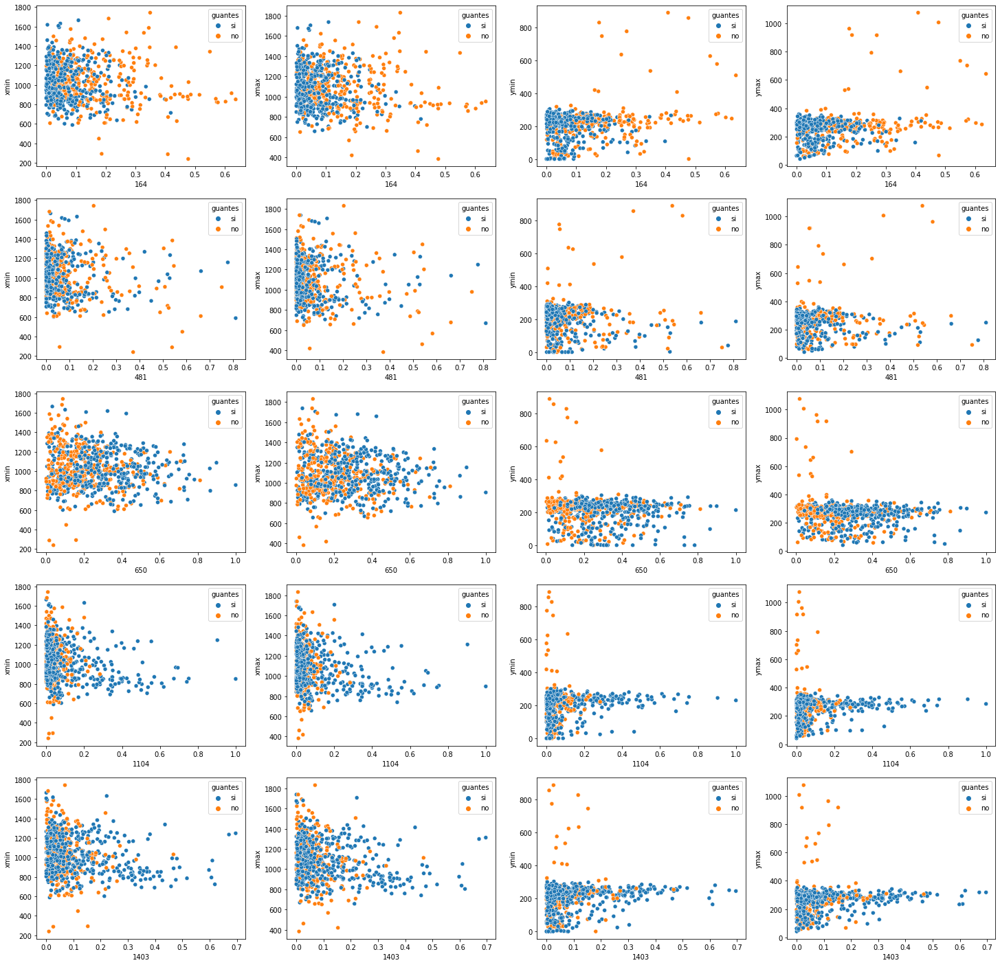

In [ ]:
#Analisis comparativo visual - No se detectan separaciones de clusters a simple vista

color = 'guantes'
# color = 'color'
fig = plt.figure(figsize=(25,25))

counter = 1

for feature_1 in features_significativas:
  for feature_2 in ["xmin", "xmax", "ymin", "ymax"]:
    ax = plt.subplot(5, 4, counter)
    sns.scatterplot(
      x=feature_1, y=feature_2, hue = color,
      data=data_small, ax=ax)
    counter = counter + 1


plt.show()

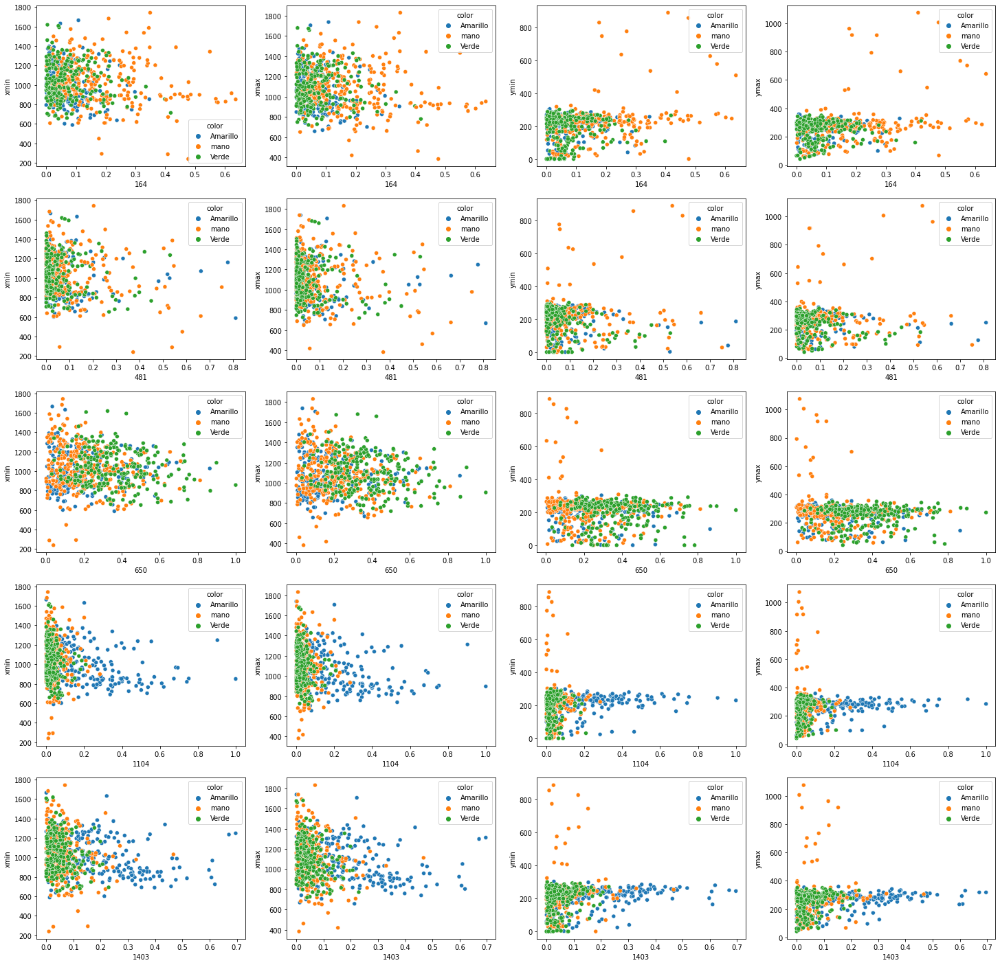

In [ ]:

color = 'color'
fig = plt.figure(figsize=(25,25))

counter = 1

for feature_1 in features_significativas:
  for feature_2 in ["xmin", "xmax", "ymin", "ymax"]:
    ax = plt.subplot(5, 4, counter)
    sns.scatterplot(
      x=feature_1, y=feature_2, hue = color,
      data=data_small, ax=ax)
    counter = counter + 1


plt.show()

##1.2 Data_big

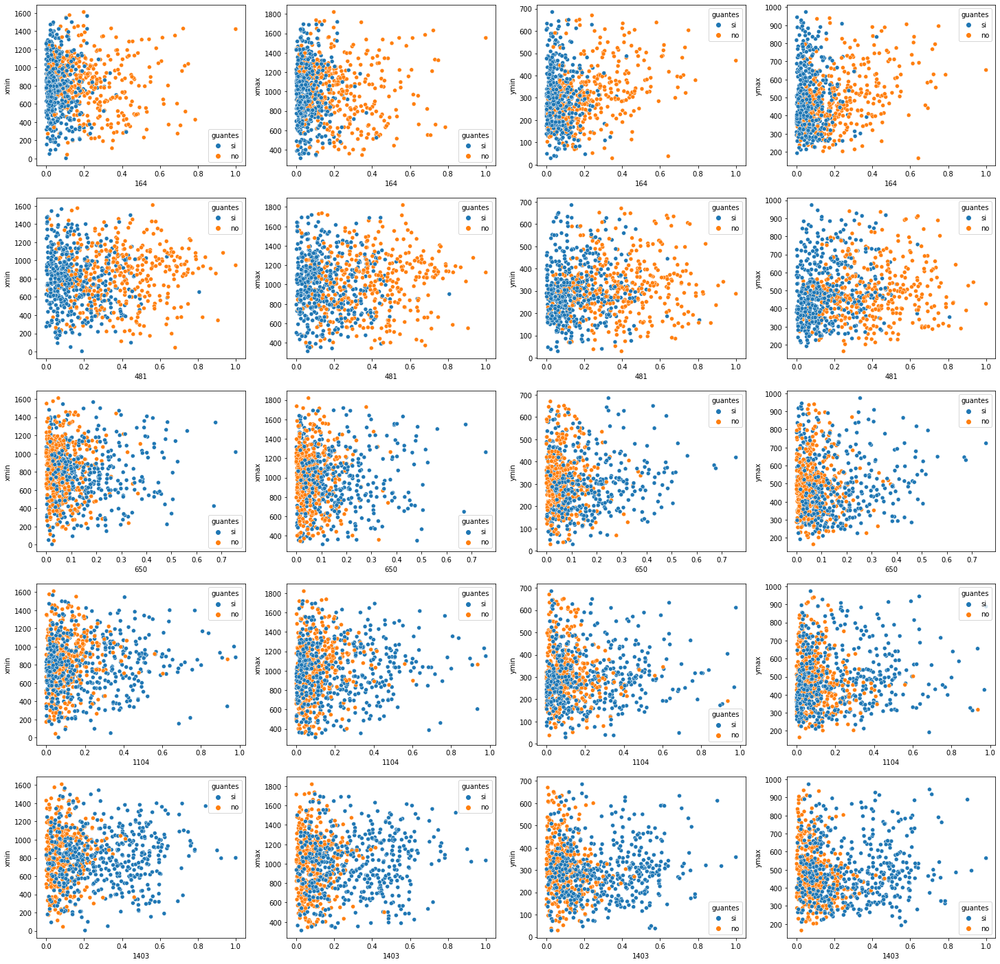

In [ ]:
color = 'guantes'
# color = 'color'
fig = plt.figure(figsize=(25,25))

counter = 1

for feature_1 in features_significativas:
  for feature_2 in ["xmin", "xmax", "ymin", "ymax"]:
    ax = plt.subplot(5, 4, counter)
    sns.scatterplot(
      x=feature_1, y=feature_2, hue = color,
      data=data_big, ax=ax)
    counter = counter + 1


plt.show()

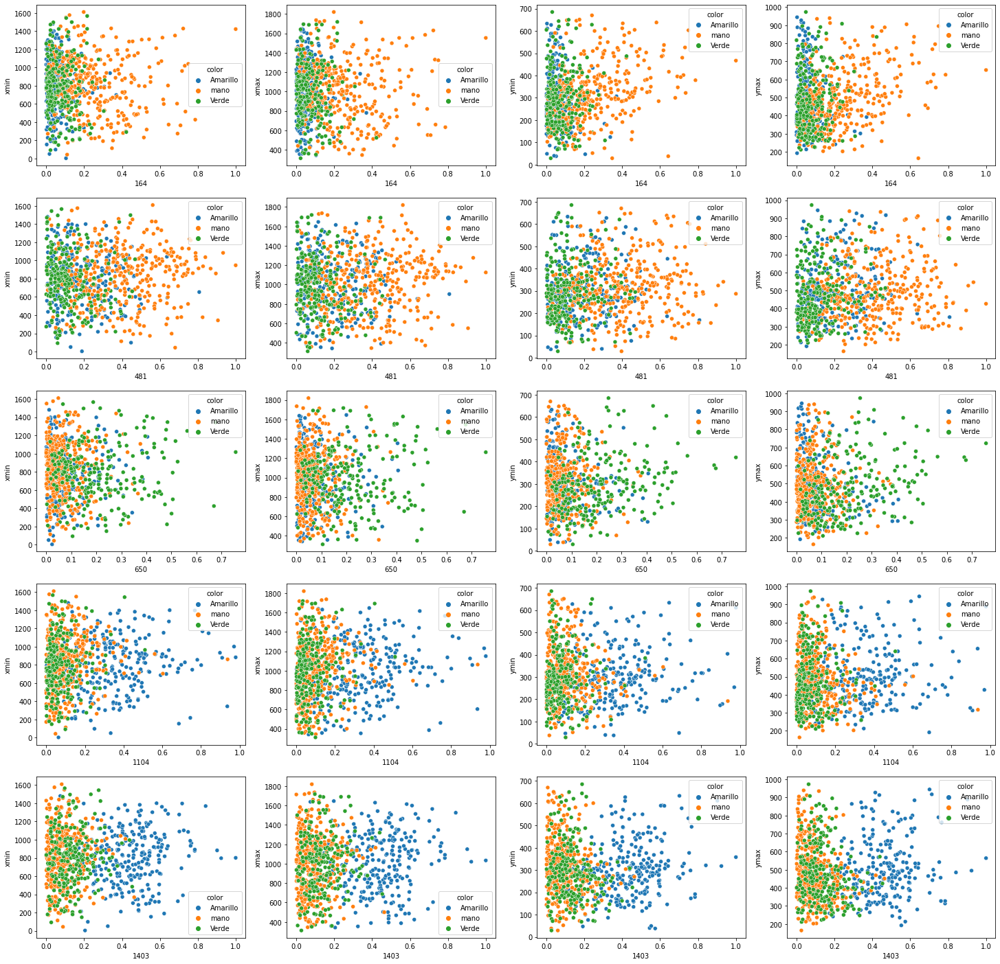

In [ ]:
color = 'color'
fig = plt.figure(figsize=(25,25))

counter = 1

for feature_1 in features_significativas:
  for feature_2 in ["xmin", "xmax", "ymin", "ymax"]:
    ax = plt.subplot(5, 4, counter)
    sns.scatterplot(
      x=feature_1, y=feature_2, hue = color,
      data=data_big, ax=ax)
    counter = counter + 1


plt.show()

En ninguno de los casos bivariables se pueden diferenciar visualmente clusters separables. Para el caso multiclase, la feature 1403 pareceria diferenciar al color Amarillo para el conjunto 'G'.

#2.0 Clustering

##2.1 Clustering: Mean Shift

###2.1.1 Data Small

In [ ]:
clustering = ["xmin", "xmax", "ymin", "ymax"] + features_significativas
data_small_clustering = data_small[clustering]
data_small_clustering

,xmin,xmax,ymin,ymax,164,481,650,1104,1403
81,888,958,246,297,0.039879,0.019379,0.061617,0.204315,0.468009
82,1039,1126,152,213,0.066068,0.518761,0.014969,0.251485,0.252495
83,871,943,215,269,0.022324,0.015145,0.097362,0.570320,0.286829
84,786,825,224,273,0.088647,0.075043,0.034170,0.269015,0.168435
85,988,1050,244,296,0.071736,0.019948,0.029472,0.257182,0.227857
...,...,...,...,...,...,...,...,...,...
1663,1312,1355,240,290,0.080903,0.025916,0.358539,0.002990,0.028435
1664,1245,1295,239,284,0.002044,0.004107,0.319787,0.054174,0.073901
1665,1194,1243,207,255,0.211098,0.119510,0.589987,0.003223,0.002991
1666,1308,1354,260,301,0.009285,0.025705,0.275754,0.010927,0.008315


In [ ]:
#MeanShift con parametros por defecto
ms = MeanShift().fit(data_small_clustering) 

clusters_MeanShift = ms.labels_
labels_unique = np.unique(clusters_MeanShift)
clusters_MeanShift_count = len(labels_unique)

print("Numero estimado de clusters para Mean Shift : %d" % clusters_MeanShift_count)

Numero estimado de clusters para Mean Shift : 7


In [ ]:
ms = MeanShift(bandwidth=420).fit(data_small_clustering) 

clusters_MeanShift = ms.labels_
labels_unique = np.unique(clusters_MeanShift)
clusters_MeanShift_count = len(labels_unique)

print("Numero estimado de clusters para Mean Shift : %d" % clusters_MeanShift_count)

Numero estimado de clusters para Mean Shift : 3


In [ ]:
#Grafico MeanShift
a = [4,5,6,7,8] 
b = [0,1,2,3,2]
configure_plotly_browser_state()
for i in range(5):
  col_1= clustering[a[i]]
  col_2= clustering[b[i]]
  MeanShift_clusters = go.Scatter(x=data_small_clustering[col_1], y=data_small_clustering[col_2],
                            mode='markers',
                            text=data_small.loc[:,'color'],
                            marker=dict(
                                  size=5,
                                  color = clusters_MeanShift.astype(np.float), #set color equal to a variable
                                  colorscale='Portland',
                                  showscale=False)
                            )
  layout = go.Layout(title="Clustering Mean Shift",titlefont=dict(size=20),
                  xaxis=dict(title=col_1),
                  yaxis=dict(title=col_2),
                  autosize=False, width=1000,height=1000)

  fig = go.Figure(data=MeanShift_clusters, layout=layout)

  iplot(fig)


In [ ]:
#Agregamos las labels calculadas al dataset para comparar mas adelante con las columnas target
data_small["MeanShiftLabel"] = clusters_MeanShift

Para Mean Shift n_clusters = 3 
 El silhouette_score promedio es : 0.5333555316580612


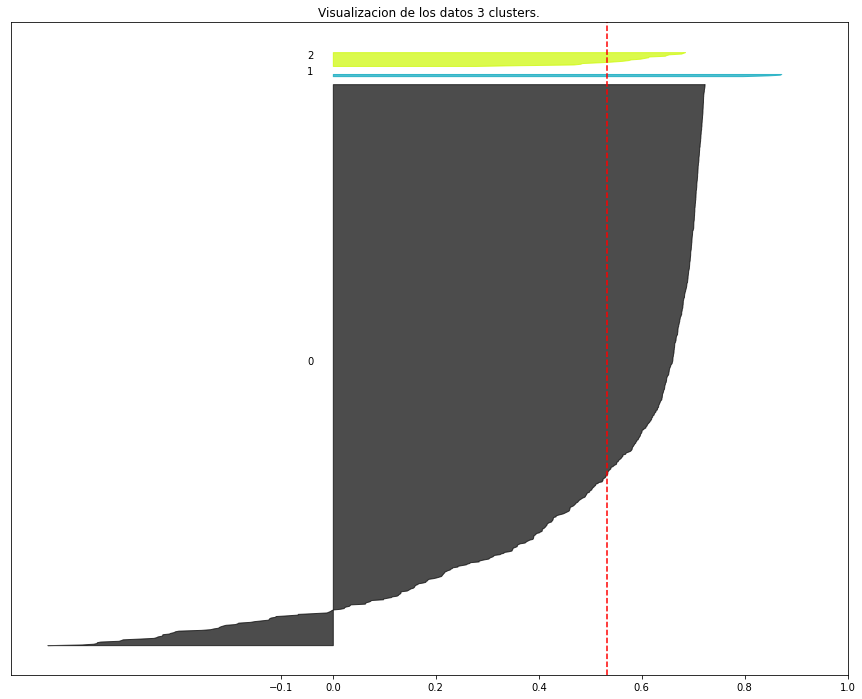

In [ ]:
#Grafico de silueta
fig = plt.figure(figsize=(15, 12))
ax1 = plt.subplot(1,1,1)

ax1 = silhouette_plt_MeanShift(data_small_clustering, clusters_MeanShift, clusters_MeanShift_count) 

plt.show()

###2.1.2 Data Big

In [ ]:
data_big_clustering = data_big[clustering]
data_big_clustering

,xmin,xmax,ymin,ymax,164,481,650,1104,1403
0,218,461,464,715,0.047367,0.272868,0.042937,0.744865,0.488075
1,617,865,432,598,0.027833,0.066733,0.008064,0.149727,0.548278
2,875,1169,321,450,0.041323,0.099604,0.003219,0.355363,0.545235
3,502,758,145,307,0.178455,0.151210,0.028567,0.213290,0.377350
4,916,1151,285,463,0.025849,0.294340,0.018720,0.563766,0.574452
...,...,...,...,...,...,...,...,...,...
1592,849,1105,158,374,0.104466,0.006632,0.149375,0.047151,0.071532
1593,1006,1155,305,493,0.010420,0.025527,0.051664,0.037607,0.101089
1594,725,880,229,352,0.155055,0.064724,0.213969,0.018730,0.158849
1595,984,1210,444,648,0.084517,0.096696,0.270969,0.237948,0.099902


In [ ]:
#MeanShift parametros por defecto

ms = MeanShift().fit(data_big_clustering) 

clusters_MeanShift = ms.labels_
labels_unique = np.unique(clusters_MeanShift)
clusters_MeanShift_count = len(labels_unique)

print("Numero estimado de clusters para Mean Shift : %d" % clusters_MeanShift_count)

Numero estimado de clusters para Mean Shift : 1


In [ ]:
#Calculamos el MeanShift usando el bandwith del paso annterior

ms = MeanShift(bandwidth=235).fit(data_big_clustering) 

clusters_MeanShift = ms.labels_
labels_unique = np.unique(clusters_MeanShift)
clusters_MeanShift_count = len(labels_unique)

print("Numero estimado de clusters para Mean Shift : %d" % clusters_MeanShift_count)

Numero estimado de clusters para Mean Shift : 3


In [ ]:
#Grafico MeanShift
a = [4,5,6,7,8] 
b = [0,1,2,3,2]
configure_plotly_browser_state()
for i in range(5):
  col_1= clustering[a[i]]
  col_2= clustering[b[i]]
  MeanShift_clusters = go.Scatter(x=data_big_clustering[col_1], y=data_big_clustering[col_2],
                            mode='markers',
                            text=data_big.loc[:,'color'],
                            marker=dict(
                                  size=5,
                                  color = clusters_MeanShift.astype(np.float), #set color equal to a variable
                                  colorscale='Portland',
                                  showscale=False)
                            )
  layout = go.Layout(title="Clustering Mean Shift",titlefont=dict(size=20),
                  xaxis=dict(title=col_1),
                  yaxis=dict(title=col_2),
                  autosize=False, width=1000,height=1000)

  fig = go.Figure(data=MeanShift_clusters, layout=layout)

  iplot(fig)


In [ ]:
#Agregamos las labels calculadas al dataset para comparar mas adelante con las columnas target
data_big["MeanShiftLabel"] = clusters_MeanShift

Para Mean Shift n_clusters = 3 
 El silhouette_score promedio es : 0.3379104099972591


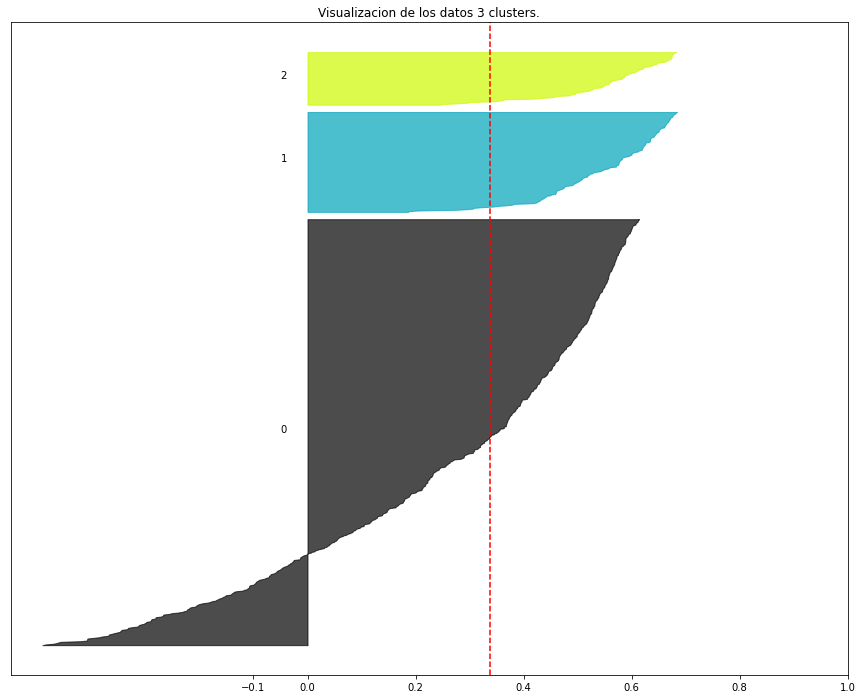

In [ ]:
#Grafico de silueta
fig = plt.figure(figsize=(15, 12))
ax1 = plt.subplot(1,1,1)

ax1 = silhouette_plt_MeanShift(data_big_clustering, clusters_MeanShift, clusters_MeanShift_count) 

plt.show()

##2.2 Clustering: K-Means

###2.2.1 Data Small

In [ ]:
#Calculamos los valores de inercia y distorsion para el KMeans usando desde 1 hasta 10 clusters

distortions = [] 
inertias = [] 
mapping1 = {} 
mapping2 = {} 
K = range(1,10) 
  
for k in K: 
    #Building and fitting the model 
    kmeanModel = KMeans(n_clusters=k).fit(data_small_clustering)    
      
    distortions.append(sum(np.min(cdist(data_small_clustering, kmeanModel.cluster_centers_, 
                      'euclidean'),axis=1)) / data_small_clustering.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(data_small_clustering, kmeanModel.cluster_centers_, 
                 'euclidean'),axis=1)) / data_small_clustering.shape[0] 
    mapping2[k] = kmeanModel.inertia_ 

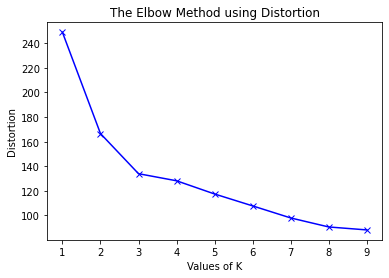

In [ ]:
#Graficos del codo para ambas metricas. El ppunto de quiebre se lo ve entre k=2 y k=3

plt.plot(K, distortions, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Distortion') 
plt.title('The Elbow Method using Distortion') 
plt.show() 

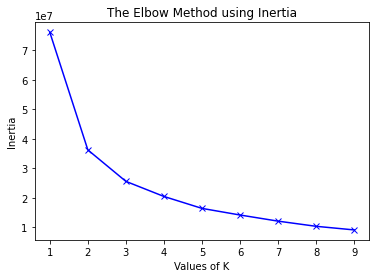

In [ ]:
plt.plot(K, inertias, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Inertia') 
plt.title('The Elbow Method using Inertia') 
plt.show() 

Para n_clusters = 2 El silhouette_score promedio es : 0.4906037426244197
Para n_clusters = 3 El silhouette_score promedio es : 0.41985805115578057
Para n_clusters = 4 El silhouette_score promedio es : 0.4287558518549003
Para n_clusters = 5 El silhouette_score promedio es : 0.41709022689560277
Para n_clusters = 6 El silhouette_score promedio es : 0.4237028774920791
Para n_clusters = 7 El silhouette_score promedio es : 0.41057662658825317


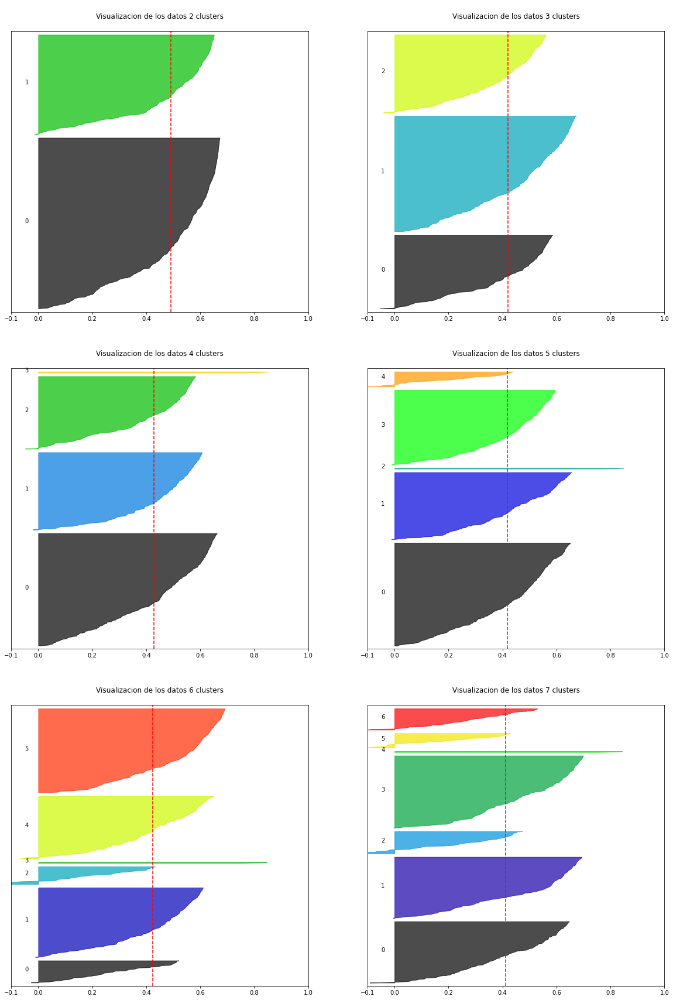

In [ ]:
#Grafico de silueta

ax1 = silhouette_plt_kmeans(data_small_clustering) 

plt.show()

Considerando los graficos de codo y la evaluacion de Silhouette el numero optimo de clusters para Kmeans es entre 2 y 3. Probemos con 2:

In [ ]:
# Número de clusters buscado
n_clust = 2

km = KMeans(n_clusters=n_clust)
km.fit(data_small_clustering)

# Recuperacion de etiquetas
clusters_Kmeans = km.labels_
data_small['KMeansLabels'] = clusters_Kmeans

In [ ]:
#Grafico KMeans
a = [4,5,6,7,8] 
b = [0,1,2,3,0]
configure_plotly_browser_state()
for i in range(5):
  col_1= clustering[a[i]]
  col_2= clustering[b[i]]
  Kmeans_clusters = go.Scatter(x=data_small_clustering[col_1], y=data_small_clustering[col_2],
                            mode='markers',
                            text=data_small.loc[:,'guantes'],
                            marker=dict(
                                  size=5,
                                  color = clusters_Kmeans.astype(np.float), #set color equal to a variable
                                  colorscale='Portland',
                                  showscale=False)
                            )
  layout = go.Layout(title="Clustering Kmeans",titlefont=dict(size=20),
                  xaxis=dict(title=col_1),
                  yaxis=dict(title=col_2),
                  autosize=False, width=1000,height=1000)

  fig = go.Figure(data=Kmeans_clusters, layout=layout)

  iplot(fig)

###2.2.2 Data Big

In [ ]:
#Calculamos los valores de inercia y distorsion para el KMeans usando desde 1 hasta 10 clusters

distortions = [] 
inertias = [] 
mapping1 = {} 
mapping2 = {} 
K = range(1,10) 
  
for k in K: 
    #Building and fitting the model 
    kmeanModel = KMeans(n_clusters=k).fit(data_big_clustering)    
      
    distortions.append(sum(np.min(cdist(data_big_clustering, kmeanModel.cluster_centers_, 
                      'euclidean'),axis=1)) / data_big_clustering.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(data_big_clustering, kmeanModel.cluster_centers_, 
                 'euclidean'),axis=1)) / data_big_clustering.shape[0] 
    mapping2[k] = kmeanModel.inertia_ 

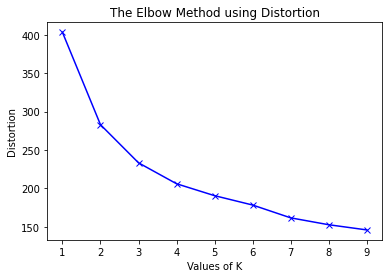

In [ ]:
#Graficos del codo para ambas metricas. No hay un resultado claramente definido. la curva es bastante suave

plt.plot(K, distortions, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Distortion') 
plt.title('The Elbow Method using Distortion') 
plt.show() 

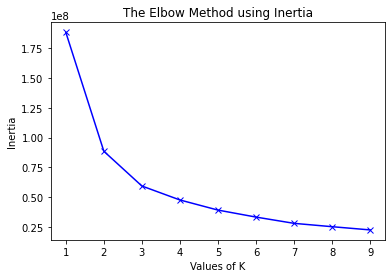

In [ ]:
plt.plot(K, inertias, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Inertia') 
plt.title('The Elbow Method using Inertia') 
plt.show() 

Para n_clusters = 2 El silhouette_score promedio es : 0.43833422084703433
Para n_clusters = 3 El silhouette_score promedio es : 0.38154516574703307
Para n_clusters = 4 El silhouette_score promedio es : 0.34134480064427875
Para n_clusters = 5 El silhouette_score promedio es : 0.35458257507713886
Para n_clusters = 6 El silhouette_score promedio es : 0.3523665981899178
Para n_clusters = 7 El silhouette_score promedio es : 0.3405010882322029


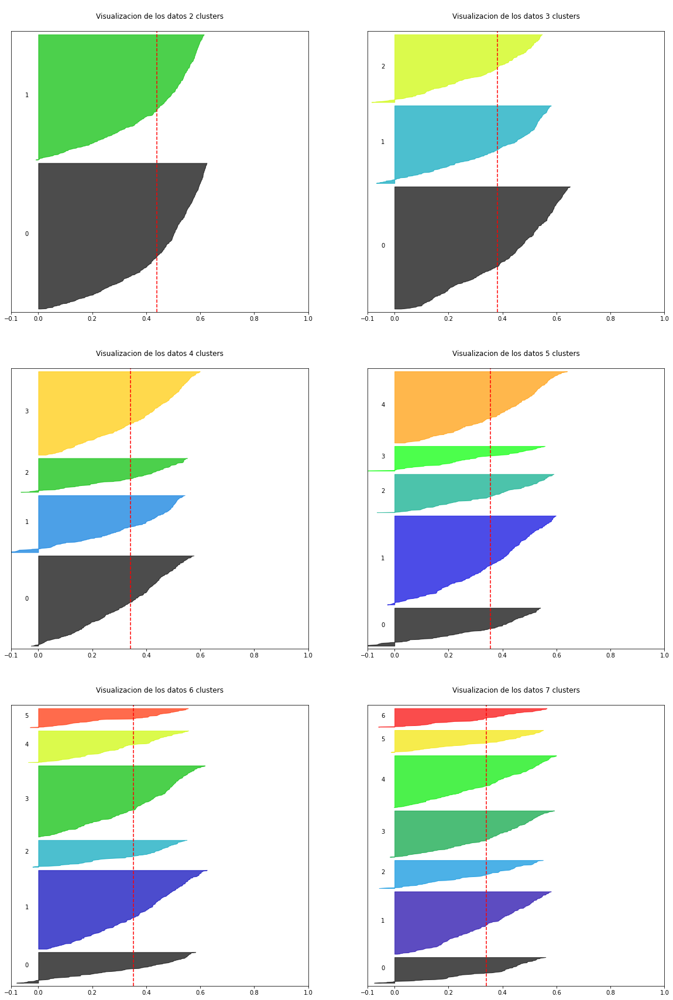

In [ ]:
#Grafico de silueta

ax1 = silhouette_plt_kmeans(data_big_clustering) 

plt.show()

Considerando los graficos de codo y la evaluacion de Silhouette el numero optimo de clusters para Kmeans es 2.

In [ ]:
# Número de clusters buscado
n_clust = 2

km = KMeans(n_clusters=n_clust)
km.fit(data_big_clustering)

# Recuperacion de etiquetas
clusters_Kmeans = km.labels_
data_big['KMeansLabels'] = clusters_Kmeans

In [ ]:
#Grafico KMeans
a = [4,5,6,7,8] 
b = [0,1,2,3,2]
configure_plotly_browser_state()
for i in range(5):
  col_1= clustering[a[i]]
  col_2= clustering[b[i]]
  Kmeans_clusters = go.Scatter(x=data_big_clustering[col_1], y=data_big_clustering[col_2],
                            mode='markers',
                            text=data_big.loc[:,'guantes'],
                            marker=dict(
                                  size=5,
                                  color = clusters_Kmeans.astype(np.float), #set color equal to a variable
                                  colorscale='Portland',
                                  showscale=False)
                            )
  layout = go.Layout(title="Clustering Kmeans",titlefont=dict(size=20),
                  xaxis=dict(title=col_1),
                  yaxis=dict(title=col_2),
                  autosize=False, width=1000,height=1000)

  fig = go.Figure(data=Kmeans_clusters, layout=layout)

  iplot(fig)

##2.3 Analisis de clusters encontrados



* El algoritmo Mean Shift con parametros por defecto, detecta 7 clusters para el dataset 'P' y 1 cluster para el dataset 'G', lo cual no tiene sentido.
* Seteando el bandwidth en Mean Shift se llegan a 3 clusters para ambos datasets. Sin embargo, no tienen similitud con los scatterplot obtenidos para cada respectivo dataset agrupando por 'guantes' o por 'color'.
* La evaluacion de silhouette para ambos datasets para 3 clusters da un valor mayor para el 'P'.
* Basandonos en el metodo del codo y la evaluacion de silhouette, seteamos a K means para encontrar 2 clusters en ambos datasets.
* Graficando los clusters con K means para las columnas ymin e ymax vs las features significativas se visualizan similares a los scatterplots obtenidos para el agrupamiento bivariable.



##2.4 Tabla de Contingencia

###2.4.1 Data Small

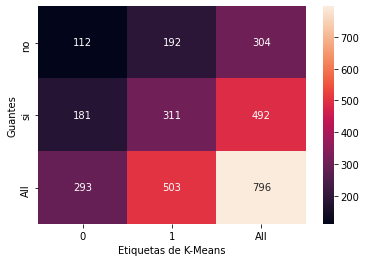

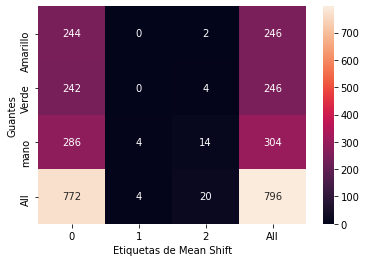

In [ ]:
tabla_objetivo = data_small

confusion_matrix = pd.crosstab(tabla_objetivo['guantes'], tabla_objetivo['KMeansLabels'], rownames=['Guantes'], colnames=['Etiquetas de K-Means'], margins=True)
sns.heatmap(confusion_matrix, annot=True, fmt='d')
plt.show()

confusion_matrix = pd.crosstab(tabla_objetivo['color'], tabla_objetivo['MeanShiftLabel'], rownames=['Guantes'], colnames=['Etiquetas de Mean Shift'], margins=True)
sns.heatmap(confusion_matrix, annot=True, fmt='d')
plt.show()

En principio podríamos afirmar que no existe relación entre las clasificaciones que disponiamos en el dataset original, con las etiquetas generadas por el clustering. 
* Para el caso de K-Means, si bien se separo en dos grupos de proporciones similares a la del dataset original (separó 37% y 63% de las observaciones con el algoritmo, contra 39% y 61% en los datos de origen), la falta de una diagonal marcada en la Tabla de Contingencia muestra que la relacion entre ambas clasificaciones no estaría relacionada.
* Respecto a Mean Shift, asignó gran parte de los registros dentro de un mismo grupo (más del 95%), lo cual elimina cualquier posibilidad de relacionarlo con las clasificaciones originales y también limita la utilidad de los resultados obtenidos en gran medida.

###2.4.2 Data Big

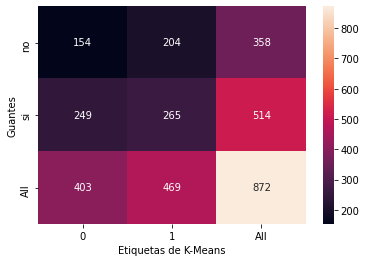

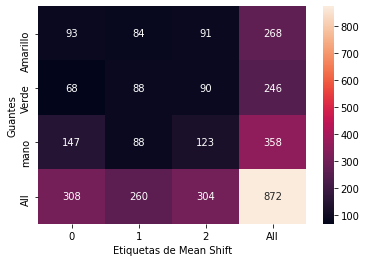

In [ ]:
tabla_objetivo = data_big

confusion_matrix = pd.crosstab(tabla_objetivo['guantes'], tabla_objetivo['KMeansLabels'], rownames=['Guantes'], colnames=['Etiquetas de K-Means'], margins=True)
sns.heatmap(confusion_matrix, annot=True, fmt='d')
plt.show()

confusion_matrix = pd.crosstab(tabla_objetivo['color'], tabla_objetivo['MeanShiftLabel'], rownames=['Guantes'], colnames=['Etiquetas de Mean Shift'], margins=True)
sns.heatmap(confusion_matrix, annot=True, fmt='d')
plt.show()

Las conclusiones obtenidas para las imagenes de manos grandes no son muy diferentes a las del caso anterior. El único punto a remarcar es la diferencia en la agrupación generada por Mean Shift que, en éste caso, se ve distribuido mas uniformemente.

Aún así, volvemos a experimentar el mismo resultado obtenido con K-Means. La ausencia de una diagonal marcada en la tabla nos muestra, una vez más, que la clasificación original de los dataset y la generada por el algoritmo son independientes una de la otra y no guardan relación.

#3.0 Visualizacion con Embeddings

##3.1 tSNE

###3.1.1 Data Small

In [ ]:
data_small_embeddings = data_small[numeric_features]

In [ ]:
from sklearn import (manifold, decomposition)

import time
time_start = time.time()

tsne = manifold.TSNE(n_components=2, verbose=1,perplexity=50, n_iter=1000, random_state=1)
X_tsne = tsne.fit_transform(data_small_embeddings)

print ('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 796 samples in 0.125s...
[t-SNE] Computed neighbors for 796 samples in 2.726s...
[t-SNE] Computed conditional probabilities for sample 796 / 796
[t-SNE] Mean sigma: 1.716607
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.328880
[t-SNE] KL divergence after 1000 iterations: 1.408136
t-SNE done! Time elapsed: 9.459592342376709 seconds


In [ ]:
configure_plotly_browser_state()
#graficamos los datos en el espacio transformado: las dos componentes tsne

graf1 = go.Scatter(x=X_tsne[:,0], y=X_tsne[:,1],
                           mode='markers',
                           marker=dict(
                                size=5)
                           )
layout = go.Layout(title="Visualización de la base en el espacio tsne",titlefont=dict(size=20),
                xaxis=dict(title='componente 1'),
                yaxis=dict(title='componente 2'),
                autosize=False, width=1000,height=1000)

fig = go.Figure(data=graf1, layout=layout)

iplot(fig)

In [ ]:
Guantes = ['si']
No_guantes = ['no']
def guantes2(guantes):
  if guantes in Guantes:
    return 'Guantes'
  elif guantes in No_guantes:
    return 'No Guantes'

In [ ]:
data_small["guantes2"]=data_small["guantes"].apply(lambda x: guantes2(x))

data_small["guantes2"].value_counts()

Guantes       492
No Guantes    304
Name: guantes2, dtype: int64

In [ ]:
guantes_si = data_small["guantes2"] == 'Guantes'
guantes_no = data_small["guantes2"] == 'No Guantes'
palette=['navy','red','#A2D5F2','orange','green','pink']  
data=[]
configure_plotly_browser_state()

gr1 =go.Scatter(x=X_tsne[guantes_si,0], y=X_tsne[guantes_si,1],name='Guantes Si',
                      opacity=0.9,marker=dict(color=palette[2],size=5),mode='markers')

gr2 =go.Scatter(x=X_tsne[guantes_no,0], y=X_tsne[guantes_no,1],name='Guantes No',
                      opacity=0.6,marker=dict(color=palette[1],size=5),mode='markers')

data=[gr1,gr2]

layout = go.Layout(title="t-SNE - Guantes",titlefont=dict(size=20),
                autosize=False, width=1150,height=1150)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

**K Means en tSNE**

In [ ]:
# Número de clusters buscado
n_clust = 2

km = KMeans(n_clusters=n_clust)
km.fit(X_tsne)

# Recuperacion de etiquetas
clusters_Kmeans = km.labels_

In [ ]:
#Grafico KMeans

configure_plotly_browser_state()

Kmeans_clusters = go.Scatter(x=X_tsne[:,0], y=X_tsne[:,1],
                            mode='markers',
                            text=data_small.loc[:,'guantes'],
                            marker=dict(
                                  size=5,
                                  color = clusters_Kmeans.astype(np.float), #set color equal to a variable
                                  colorscale='Portland',
                                  showscale=False)
                            )
layout = go.Layout(title="Clustering Kmeans en el espacio tSNE",titlefont=dict(size=20),
                  xaxis=dict(title=col_1),
                  yaxis=dict(title=col_2),
                  autosize=False, width=1000,height=1000)

fig = go.Figure(data=Kmeans_clusters, layout=layout)

iplot(fig)

**Mean Shift en tSNE**

In [ ]:
ms = MeanShift().fit(X_tsne) 

clusters_MeanShift = ms.labels_
labels_unique = np.unique(clusters_MeanShift)
clusters_MeanShift_count = len(labels_unique)

print("Numero estimado de clusters para Mean Shift : %d" % clusters_MeanShift_count)

Numero estimado de clusters para Mean Shift : 1


In [ ]:
#Grafico Mean Shift

configure_plotly_browser_state()

Kmeans_clusters = go.Scatter(x=X_tsne[:,0], y=X_tsne[:,1],
                            mode='markers',
                            text=data_small.loc[:,'guantes'],
                            marker=dict(
                                  size=5,
                                  color = clusters_MeanShift.astype(np.float), #set color equal to a variable
                                  colorscale='Portland',
                                  showscale=False)
                            )
layout = go.Layout(title="Clustering Kmeans en el espacio tSNE",titlefont=dict(size=20),
                  xaxis=dict(title=col_1),
                  yaxis=dict(title=col_2),
                  autosize=False, width=1000,height=1000)

fig = go.Figure(data=Kmeans_clusters, layout=layout)

iplot(fig)

###3.1.2 Data Big

In [ ]:
data_big_embeddings = data_big[numeric_features]

In [ ]:
from sklearn import (manifold, decomposition)

import time
time_start = time.time()

tsne = manifold.TSNE(n_components=2, verbose=1,perplexity=50, n_iter=5000, random_state=1)
X_tsne = tsne.fit_transform(data_big_embeddings)

print ('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 872 samples in 0.146s...
[t-SNE] Computed neighbors for 872 samples in 3.187s...
[t-SNE] Computed conditional probabilities for sample 872 / 872
[t-SNE] Mean sigma: 2.229554
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.999771
[t-SNE] KL divergence after 3200 iterations: 1.321743
t-SNE done! Time elapsed: 24.625444650650024 seconds


In [ ]:
configure_plotly_browser_state()
#graficamos los datos en el espacio transformado: las dos componentes tsne

graf1 = go.Scatter(x=X_tsne[:,0], y=X_tsne[:,1],
                           mode='markers',
                           marker=dict(
                                size=5)
                           )
layout = go.Layout(title="Visualización de la base en el espacio tsne",titlefont=dict(size=20),
                xaxis=dict(title='componente 1'),
                yaxis=dict(title='componente 2'),
                autosize=False, width=1000,height=1000)

fig = go.Figure(data=graf1, layout=layout)

iplot(fig)

In [ ]:
Guantes = ['si']
No_guantes = ['no']
def guantes2(guantes):
  if guantes in Guantes:
    return 'Guantes'
  elif guantes in No_guantes:
    return 'No Guantes'

In [ ]:
data_big["guantes2"]=data_big["guantes"].apply(lambda x: guantes2(x))

data_big["guantes2"].value_counts()

Guantes       514
No Guantes    358
Name: guantes2, dtype: int64

In [ ]:
guantes_si = data_big["guantes2"] == 'Guantes'
guantes_no = data_big["guantes2"] == 'No Guantes'
palette=['navy','red','#A2D5F2','orange','green','pink']  
data=[]
configure_plotly_browser_state()

gr1 =go.Scatter(x=X_tsne[guantes_si,0], y=X_tsne[guantes_si,1],name='Guantes Si',
                      opacity=0.9,marker=dict(color=palette[2],size=5),mode='markers')

gr2 =go.Scatter(x=X_tsne[guantes_no,0], y=X_tsne[guantes_no,1],name='Guantes No',
                      opacity=0.6,marker=dict(color=palette[1],size=5),mode='markers')

data=[gr1,gr2]

layout = go.Layout(title="t-SNE - Guantes",titlefont=dict(size=20),
                autosize=False, width=1150,height=1150)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

**K Means en tSNE**

In [ ]:
# Número de clusters buscado
n_clust = 2

km = KMeans(n_clusters=n_clust)
km.fit(X_tsne)

# Recuperacion de etiquetas
clusters_Kmeans = km.labels_

In [ ]:
#Grafico KMeans

configure_plotly_browser_state()

Kmeans_clusters = go.Scatter(x=X_tsne[:,0], y=X_tsne[:,1],
                            mode='markers',
                            text=data_big.loc[:,'guantes'],
                            marker=dict(
                                  size=5,
                                  color = clusters_Kmeans.astype(np.float), #set color equal to a variable
                                  colorscale='Portland',
                                  showscale=False)
                            )
layout = go.Layout(title="Clustering Kmeans en el espacio tSNE",titlefont=dict(size=20),
                  xaxis=dict(title=col_1),
                  yaxis=dict(title=col_2),
                  autosize=False, width=1000,height=1000)

fig = go.Figure(data=Kmeans_clusters, layout=layout)

iplot(fig)

**Mean Shift en tSNE**

In [ ]:
ms = MeanShift().fit(X_tsne) 

clusters_MeanShift = ms.labels_
labels_unique = np.unique(clusters_MeanShift)
clusters_MeanShift_count = len(labels_unique)

print("Numero estimado de clusters para Mean Shift : %d" % clusters_MeanShift_count)

Numero estimado de clusters para Mean Shift : 1


In [ ]:
#Grafico Mean Shift

configure_plotly_browser_state()

Kmeans_clusters = go.Scatter(x=X_tsne[:,0], y=X_tsne[:,1],
                            mode='markers',
                            text=data_small.loc[:,'guantes'],
                            marker=dict(
                                  size=5,
                                  color = clusters_MeanShift.astype(np.float), #set color equal to a variable
                                  colorscale='Portland',
                                  showscale=False)
                            )
layout = go.Layout(title="Clustering Kmeans en el espacio tSNE",titlefont=dict(size=20),
                  xaxis=dict(title=col_1),
                  yaxis=dict(title=col_2),
                  autosize=False, width=1000,height=1000)

fig = go.Figure(data=Kmeans_clusters, layout=layout)

iplot(fig)

###3.1.3 Analisis embedding con tSNE

El espacio tSNE no logra diferenciar los clusters de guantes para ninguno de los datasets.

##3.2 Componentes Principales

###3.2.1 Data Small

In [ ]:
from sklearn.decomposition import PCA

#Dataset ya se encuentra normalizado. No hace falta trabajo previo
data_small_PCA = data_small[numeric_features]

pca = PCA(n_components=4)
pca.fit(data_small_PCA)

# proporción de varianza
print('proporción de varianza por componente: ', pca.explained_variance_ratio_)
# proporción de varianza acumulada
print ('proporción de varianza por componente acumulada: ', pca.explained_variance_ratio_.cumsum())

x_projected = pca.transform(data_small_PCA)
print ('tamaño de los datos: ', x_projected.shape)

proporción de varianza por componente:  [0.11016951 0.05594178 0.04237152 0.03629258]
proporción de varianza por componente acumulada:  [0.11016951 0.16611129 0.20848281 0.24477539]
tamaño de los datos:  (796, 4)


In [ ]:
pcs = pca.components_ 

data=[]

config = {"displayModeBar": False, "showTips": False, 
          'displaylogo': False, 'responsive': False, 'staticPlot': True, 
          'toImageButtonOptions': {'format': 'png'},
          'editable': False}

for i, (x_pca, y_pca) in enumerate(zip(pcs[0,:], pcs[1,:])):
    graph=go.Scatter(x=[0,x_pca],y=[0,y_pca],text=data_small_PCA.columns[i],
                     mode='lines+markers+text',textposition='top left',
                     textfont=dict(family='sans serif',size=15))
    data.append(graph)

layout = go.Layout(title="ACP - Data_Small",titlefont=dict(size=20),
            xaxis=dict(title='Componente 1'),
            yaxis=dict(title='Componente 2'),
            autosize=False, width=750,height=650,
            showlegend=False)

fig = go.Figure(data=data, layout=layout)
#fig.show(renderer="colab")
fig.show(renderer='colab', config=config)
# iplot(fig)

**K Means con PCA**

In [ ]:
n_clust = 2
km = KMeans(n_clusters=n_clust)
km.fit(x_projected)
clusters = km.labels_

In [ ]:
#Grafico KMeans

configure_plotly_browser_state()

Kmeans_clusters = go.Scatter(x=x_projected[:,0], y=x_projected[:,1],
                            mode='markers',
                            text=data_small.loc[:,'guantes'],
                            marker=dict(
                                  size=5,
                                  color = clusters.astype(np.float), #set color equal to a variable
                                  colorscale='Portland',
                                  showscale=False)
                            )
layout = go.Layout(title="ACP + Clustering K means",titlefont=dict(size=20),
            xaxis=dict(title='Componente 1'),
            yaxis=dict(title='Componente 2'),
            autosize=False, width=750,height=650,
            showlegend=False)

fig = go.Figure(data=Kmeans_clusters, layout=layout)

iplot(fig)

**Mean Shift con PCA**

In [ ]:
ms = MeanShift().fit(x_projected) 

clusters_MeanShift = ms.labels_
labels_unique = np.unique(clusters_MeanShift)
clusters_MeanShift_count = len(labels_unique)

print("Numero estimado de clusters para Mean Shift : %d" % clusters_MeanShift_count)

Numero estimado de clusters para Mean Shift : 1


In [ ]:
#Grafico Mean Shift

configure_plotly_browser_state()

Kmeans_clusters = go.Scatter(x=x_projected[:,0], y=x_projected[:,1],
                            mode='markers',
                            text=data_small.loc[:,'guantes'],
                            marker=dict(
                                  size=5,
                                  color = clusters_MeanShift.astype(np.float), #set color equal to a variable
                                  colorscale='Portland',
                                  showscale=False)
                            )
layout = go.Layout(title="ACP + Clustering Mean Shift",titlefont=dict(size=20),
            xaxis=dict(title='Componente 1'),
            yaxis=dict(title='Componente 2'),
            autosize=False, width=750,height=650,
            showlegend=False)

fig = go.Figure(data=Kmeans_clusters, layout=layout)

iplot(fig)

###3.2.2 Data Big

In [ ]:
from sklearn.decomposition import PCA

#Dataset ya se encuentra normalizado. No hace falta trabajo previo
data_big_PCA = data_big[numeric_features]

pca = PCA(n_components=4)
pca.fit(data_big_PCA)

# proporción de varianza
print('proporción de varianza por componente: ', pca.explained_variance_ratio_)
# proporción de varianza acumulada
print ('proporción de varianza por componente acumulada: ', pca.explained_variance_ratio_.cumsum())

x_projected = pca.transform(data_big_PCA)
print ('tamaño de los datos: ', x_projected.shape)

proporción de varianza por componente:  [0.07832017 0.06604215 0.05187973 0.04246058]
proporción de varianza por componente acumulada:  [0.07832017 0.14436232 0.19624204 0.23870262]
tamaño de los datos:  (872, 4)


In [ ]:
pcs = pca.components_ 

data=[]

config = {"displayModeBar": False, "showTips": False, 
          'displaylogo': False, 'responsive': False, 'staticPlot': True, 
          'toImageButtonOptions': {'format': 'png'},
          'editable': False}

for i, (x_pca, y_pca) in enumerate(zip(pcs[0,:], pcs[1,:])):
    graph=go.Scatter(x=[0,x_pca],y=[0,y_pca],text=data_big_PCA.columns[i],
                     mode='lines+markers+text',textposition='top left',
                     textfont=dict(family='sans serif',size=15))
    data.append(graph)

layout = go.Layout(title="ACP - Data_Big",titlefont=dict(size=20),
            xaxis=dict(title='Componente 1'),
            yaxis=dict(title='Componente 2'),
            autosize=False, width=750,height=650,
            showlegend=False)

fig = go.Figure(data=data, layout=layout)
#fig.show(renderer="colab")
fig.show(renderer='colab', config=config)
# iplot(fig)

**K Means con PCA**

In [ ]:
n_clust = 2
km = KMeans(n_clusters=n_clust)
km.fit(x_projected)
clusters = km.labels_

In [ ]:
#Grafico KMeans

configure_plotly_browser_state()

Kmeans_clusters = go.Scatter(x=x_projected[:,0], y=x_projected[:,1],
                            mode='markers',
                            text=data_small.loc[:,'guantes'],
                            marker=dict(
                                  size=5,
                                  color = clusters.astype(np.float), #set color equal to a variable
                                  colorscale='Portland',
                                  showscale=False)
                            )
layout = go.Layout(title="ACP + Clustering K means",titlefont=dict(size=20),
            xaxis=dict(title='Componente 1'),
            yaxis=dict(title='Componente 2'),
            autosize=False, width=750,height=650,
            showlegend=False)

fig = go.Figure(data=Kmeans_clusters, layout=layout)

iplot(fig)

**Mean Shift con PCA**

In [ ]:
ms = MeanShift().fit(x_projected) 

clusters_MeanShift = ms.labels_
labels_unique = np.unique(clusters_MeanShift)
clusters_MeanShift_count = len(labels_unique)

print("Numero estimado de clusters para Mean Shift : %d" % clusters_MeanShift_count)

Numero estimado de clusters para Mean Shift : 1


In [ ]:
#Grafico Mean Shift

configure_plotly_browser_state()

Kmeans_clusters = go.Scatter(x=x_projected[:,0], y=x_projected[:,1],
                            mode='markers',
                            text=data_small.loc[:,'guantes'],
                            marker=dict(
                                  size=5,
                                  color = clusters_MeanShift.astype(np.float), #set color equal to a variable
                                  colorscale='Portland',
                                  showscale=False)
                            )
layout = go.Layout(title="ACP + Clustering Mean Shift",titlefont=dict(size=20),
            xaxis=dict(title='Componente 1'),
            yaxis=dict(title='Componente 2'),
            autosize=False, width=750,height=650,
            showlegend=False)

fig = go.Figure(data=Kmeans_clusters, layout=layout)

iplot(fig)

###3.2.3 Analisis embeding con PCA

El algoritmo por componentes principales tampoco logra diferenciar los clusters de guantes para ningun dataset.

#4.0 Self Learning

In [ ]:
import os
os.chdir('/content/drive/My Drive/Mentoria')

data_sets_path = "/content/drive/My Drive/Mentoria/Dataset-M/G/train"
os.chdir('{}'.format(data_sets_path))

##4.1 Guantes Amarillos

dimensiones de la imagen:  (1080, 1920, 3) es decir:  1080 x 1920  pixeles RGB
tipo de datos:  uint8


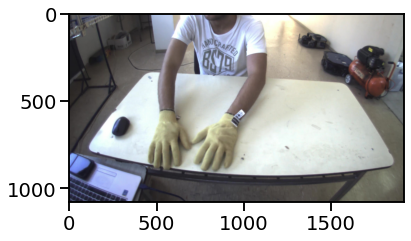

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
guantes_cv=cv2.imread('M_G_Mostrando_Amarillos_24.jpg')
amarillos=guantes_cv.copy()
amarillos[:,:,[2,1,0]]=guantes_cv #cv2 lee en orden BGR'
print('dimensiones de la imagen: ', amarillos.shape, 'es decir: ', amarillos.shape[0],'x',amarillos.shape[1],' pixeles RGB')
print('tipo de datos: ', amarillos.dtype)
plt.imshow(amarillos)


In [ ]:
dims=amarillos.shape
cant_filas=dims[0]
cant_columnas=dims[1]
cant_pixeles=cant_filas*cant_columnas
data0=np.zeros([cant_pixeles,4],dtype='int')
for f in range(cant_filas):
    for c in range(cant_columnas):
        nro=f*cant_columnas+c
        data0[nro,0]=nro
        data0[nro,1:4]=amarillos[f,c,:]

df = pd.DataFrame(data0, columns=["pixel_id","rojo","verde","azul"])

print('Tamaño de Base de pixeles:', df.shape)
df.head()

Tamaño de Base de pixeles: (2073600, 4)


,pixel_id,rojo,verde,azul
0,0,52,51,59
1,1,52,51,59
2,2,52,51,57
3,3,52,51,57
4,4,53,52,58


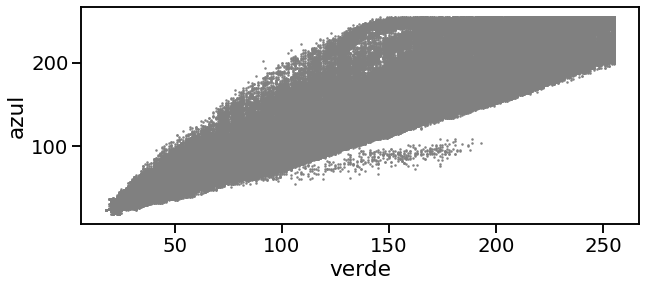

In [ ]:
import matplotlib.patches as mpatches

variables=["rojo","verde","azul"]

variable1=variables[1]
variable2=variables[2]

f1 = df[variable1].values
f2 = df[variable2].values

plt.figure(figsize=(10,4))
sns.set_context(context='talk', font_scale=1.2)
plt.scatter(f1, f2,c='gray', s=1)
plt.xlabel(variable1)
plt.ylabel(variable2)
plt.show()

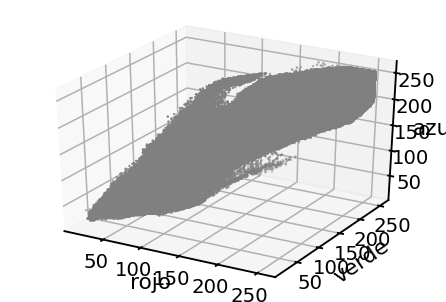

<Figure size 3600x1440 with 0 Axes>

In [ ]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D

fig = pyplot.figure()
ax = Axes3D(fig)

ax.scatter(df[variables[0]].values, df[variables[1]].values, df[variables[2]].values,c='gray', s=1)
ax.set_xlabel(variables[0])
ax.set_ylabel(variables[1])
ax.set_zlabel(variables[2])

plt.figure(figsize=(50,20))
plt.show()

In [ ]:
#guantes
roi1=(832, 643, 115, 92)
#persona
roi2=(1043, 316, 61, 111)
#fondo
roi3=(1176, 31, 612, 629)

In [ ]:
rois=[roi1,roi2,roi3]

In [ ]:
cantidad=0
for i in range(3):
    cantidad=cantidad+(rois[i][2]*rois[i][3])
print (cantidad)
data=np.zeros([cantidad,5],dtype='int')
target=np.zeros(cantidad,dtype='int')
cuenta=0
for i in range(3):
    roi=rois[i]
    
    for fil in range (roi[1],roi[1]+roi[3]):
        for col in range (roi[0],roi[0]+roi[2]):
            nro=fil*cant_columnas+col
            data[cuenta,0]=nro
            data[cuenta,1:4]=amarillos[fil,col,:]
            data[cuenta,4]=i+1
            target[cuenta]=i+1
            cuenta=cuenta+1

df_etiquetado = pd.DataFrame(data, columns=["pixel_id","rojo","verde","azul","etiqueta"])
print(df_etiquetado.shape)
print('Base de pixeles etiquetados:')
df_etiquetado.head()

402299
(402299, 5)
Base de pixeles etiquetados:


,pixel_id,rojo,verde,azul,etiqueta
0,1235392,227,231,194,1
1,1235393,224,228,191,1
2,1235394,219,223,186,1
3,1235395,213,217,180,1
4,1235396,208,212,175,1


cantidad de muestras etiquetadas: 402299
cantidad de clases etiquetadas: 3
cantidad de variables/dimension: 3
se grafican de a dos (dimensión 2)


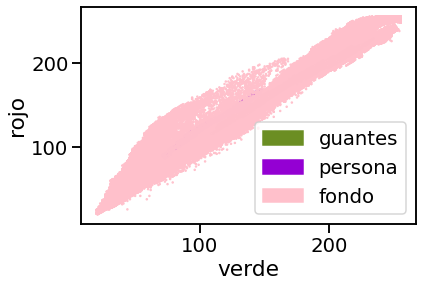

In [ ]:
import matplotlib.patches as mpatches

colores=['olivedrab','darkviolet','pink']
variables=["rojo","verde","azul"]

variable1=variables[1]
variable2=variables[0]

f1 = df_etiquetado[variable1].values
f2 = df_etiquetado[variable2].values
f3 = target

# Vamos a pintar en colores las 3 clases: verde: 0, azul:1, rosa:2
asignar=[]
l=len(f3)
print('cantidad de muestras etiquetadas:',l)
print('cantidad de clases etiquetadas:',3)
print('cantidad de variables/dimension:',3)
print('se grafican de a dos (dimensión 2)')

for k in range(l): #for index, row in filtered_data.iterrows():
    if(f3[k]==1):
        asignar.append(colores[0])
    elif (f3[k]==2):
        asignar.append(colores[1])
    else:
        asignar.append(colores[2])
plt.scatter(f1, f2, c=asignar, s=1)
plt.xlabel(variable1)
plt.ylabel(variable2)
patch1 = mpatches.Patch(color=colores[0], label='guantes')
patch2 = mpatches.Patch(color=colores[1], label='persona')
patch3 = mpatches.Patch(color=colores[2], label='fondo')
plt.legend(handles=[patch1,patch2,patch3])
plt.show()

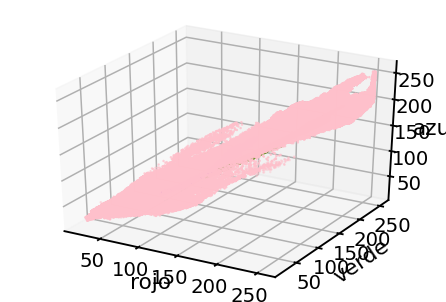

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = Axes3D(fig)

ax.scatter(df_etiquetado[variables[0]].values, df_etiquetado[variables[1]].values, df_etiquetado[variables[2]].values,c=asignar, s=1)
ax.set_xlabel(variables[0])
ax.set_ylabel(variables[1])
ax.set_zlabel(variables[2])
plt.show()

**k-Nearest Neighbors con los pixeles etiquetados**



In [ ]:
from sklearn.neighbors import KNeighborsClassifier
n_neighbors = 5
data_rgb=data[:,1:4]

knn = KNeighborsClassifier(n_neighbors)
knn.fit(data_rgb, target)
print('Presición (Accuracy) del clasificador K-NN en el conjunto de entrenamiento: {:.2f}'
     .format(knn.score(data_rgb, target)))

Presición (Accuracy) del clasificador K-NN en el conjunto de entrenamiento: 1.00


(1080, 1920, 3)
[3]


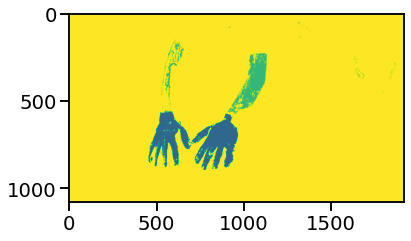

In [ ]:
a=amarillos.shape
print(a)
clasif=np.zeros(a[0:2],dtype='int')
print(knn.predict([[40, 80, 40]]))
for i in range(a[0]): #filas
    for j in range(a[1]): #columnas
        clasif[i,j]=knn.predict([amarillos[i,j,:]])        
clasif[0,0]=0 #para unificar paletas (con 4 colores)         
plt.imshow(clasif)

In [ ]:
from statistics import mode
clasif2=clasif.copy()
for i in range(2,a[0]-2): #filas
    for j in range(2,a[1]-2): #columnas
        try:
            clasif2[i,j]=mode(clasif[i-2:i+3,j-2:j+3].ravel())
        except:
            clasif2[i,j]=clasif[i,j]
clasif2[0,0]=0 #para unificar paletas (con 4 colores)

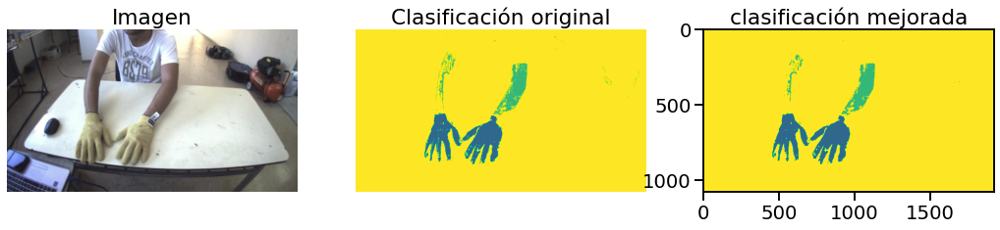

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=3, sharex=True)
fig.set_figheight(10)
fig.set_figwidth(18)
axs[0].imshow(amarillos)
axs[0].set_title("Imagen")
axs[0].axis('off')
axs[1].imshow(clasif)
axs[1].set_title("Clasificación original")
axs[1].axis('off')
axs[2].imshow(clasif2)
axs[2].set_title('clasificación mejorada')
#axs[2].axis('off')
plt.show()

##4.2 Guantes Verdes

dimensiones de la imagen:  (1080, 1920, 3) es decir:  1080 x 1920  pixeles RGB
tipo de datos:  uint8


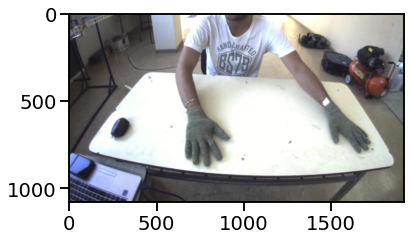

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
guantes_cv=cv2.imread('M_G_Mostrando_Verdes_60.jpg')
verdes=guantes_cv.copy()
verdes[:,:,[2,1,0]]=guantes_cv #cv2 lee en orden BGR'
print('dimensiones de la imagen: ', verdes.shape, 'es decir: ', verdes.shape[0],'x',verdes.shape[1],' pixeles RGB')
print('tipo de datos: ', verdes.dtype)
plt.imshow(verdes)


In [ ]:
dims=verdes.shape
cant_filas=dims[0]
cant_columnas=dims[1]
cant_pixeles=cant_filas*cant_columnas
data0=np.zeros([cant_pixeles,4],dtype='int')
for f in range(cant_filas):
    for c in range(cant_columnas):
        nro=f*cant_columnas+c
        data0[nro,0]=nro
        data0[nro,1:4]=verdes[f,c,:]

df = pd.DataFrame(data0, columns=["pixel_id","rojo","verde","azul"])

print('Tamaño de Base de pixeles:', df.shape)
df.head()

Tamaño de Base de pixeles: (2073600, 4)


,pixel_id,rojo,verde,azul
0,0,51,50,58
1,1,51,50,58
2,2,51,50,56
3,3,52,51,57
4,4,54,53,59


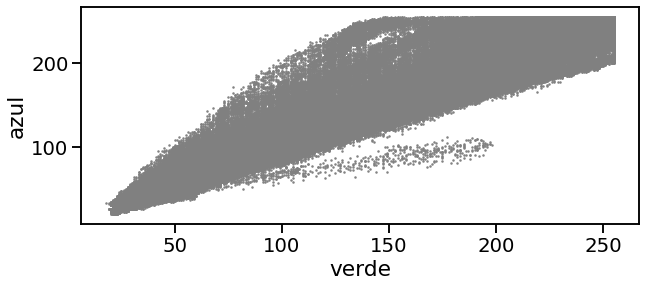

In [ ]:
import matplotlib.patches as mpatches

variables=["rojo","verde","azul"]

variable1=variables[1]
variable2=variables[2]

f1 = df[variable1].values
f2 = df[variable2].values

plt.figure(figsize=(10,4))
sns.set_context(context='talk', font_scale=1.2)
plt.scatter(f1, f2,c='gray', s=1)
plt.xlabel(variable1)
plt.ylabel(variable2)
plt.show()

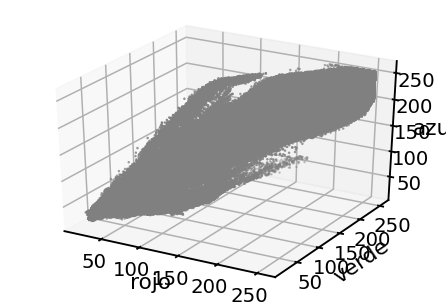

<Figure size 3600x1440 with 0 Axes>

In [ ]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D

fig = pyplot.figure()
ax = Axes3D(fig)

ax.scatter(df[variables[0]].values, df[variables[1]].values, df[variables[2]].values,c='gray', s=1)
ax.set_xlabel(variables[0])
ax.set_ylabel(variables[1])
ax.set_zlabel(variables[2])

plt.figure(figsize=(50,20))
plt.show()

In [ ]:
#guantes
roi1=(719, 619, 61, 81)
#persona
roi2=(665, 238, 35, 254)
#fondo
roi3=(1117, 9, 410, 191)

In [ ]:
rois=[roi1,roi2,roi3]

In [ ]:
cantidad=0
for i in range(3):
    cantidad=cantidad+(rois[i][2]*rois[i][3])
print (cantidad)
data=np.zeros([cantidad,5],dtype='int')
target=np.zeros(cantidad,dtype='int')
cuenta=0
for i in range(3):
    roi=rois[i]
    
    for fil in range (roi[1],roi[1]+roi[3]):
        for col in range (roi[0],roi[0]+roi[2]):
            nro=fil*cant_columnas+col
            data[cuenta,0]=nro
            data[cuenta,1:4]=verdes[fil,col,:]
            data[cuenta,4]=i+1
            target[cuenta]=i+1
            cuenta=cuenta+1

df_etiquetado = pd.DataFrame(data, columns=["pixel_id","rojo","verde","azul","etiqueta"])
print(df_etiquetado.shape)
print('Base de pixeles etiquetados:')
df_etiquetado.head()

92141
(92141, 5)
Base de pixeles etiquetados:


,pixel_id,rojo,verde,azul,etiqueta
0,1189199,116,128,128,1
1,1189200,120,130,129,1
2,1189201,119,129,128,1
3,1189202,119,129,128,1
4,1189203,118,128,127,1


cantidad de muestras etiquetadas: 92141
cantidad de clases etiquetadas: 3
cantidad de variables/dimension: 3
se grafican de a dos (dimensión 2)


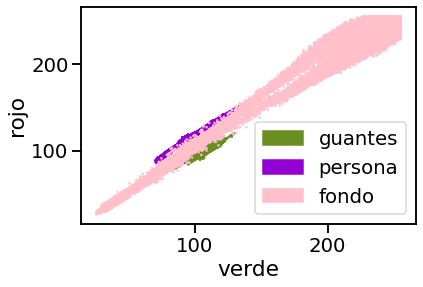

In [ ]:
import matplotlib.patches as mpatches

colores=['olivedrab','darkviolet','pink']
variables=["rojo","verde","azul"]

variable1=variables[1]
variable2=variables[0]

f1 = df_etiquetado[variable1].values
f2 = df_etiquetado[variable2].values
f3 = target

# Vamos a pintar en colores las 3 clases: verde: 0, azul:1, rosa:2
asignar=[]
l=len(f3)
print('cantidad de muestras etiquetadas:',l)
print('cantidad de clases etiquetadas:',3)
print('cantidad de variables/dimension:',3)
print('se grafican de a dos (dimensión 2)')

for k in range(l): #for index, row in filtered_data.iterrows():
    if(f3[k]==1):
        asignar.append(colores[0])
    elif (f3[k]==2):
        asignar.append(colores[1])
    else:
        asignar.append(colores[2])
plt.scatter(f1, f2, c=asignar, s=1)
plt.xlabel(variable1)
plt.ylabel(variable2)
patch1 = mpatches.Patch(color=colores[0], label='guantes')
patch2 = mpatches.Patch(color=colores[1], label='persona')
patch3 = mpatches.Patch(color=colores[2], label='fondo')
plt.legend(handles=[patch1,patch2,patch3])
plt.show()

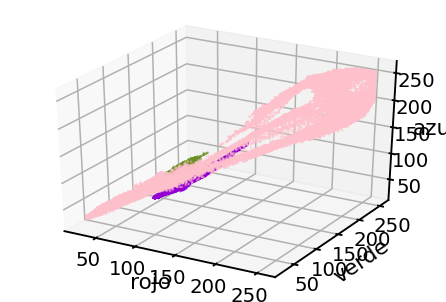

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = Axes3D(fig)

ax.scatter(df_etiquetado[variables[0]].values, df_etiquetado[variables[1]].values, df_etiquetado[variables[2]].values,c=asignar, s=1)
ax.set_xlabel(variables[0])
ax.set_ylabel(variables[1])
ax.set_zlabel(variables[2])
plt.show()

**k-Nearest Neighbors con los pixeles etiquetados**



In [ ]:
from sklearn.neighbors import KNeighborsClassifier
n_neighbors = 5
data_rgb=data[:,1:4]

knn = KNeighborsClassifier(n_neighbors)
knn.fit(data_rgb, target)
print('Presición (Accuracy) del clasificador K-NN en el conjunto de entrenamiento: {:.2f}'
     .format(knn.score(data_rgb, target)))

Presición (Accuracy) del clasificador K-NN en el conjunto de entrenamiento: 1.00


(1080, 1920, 3)
[3]


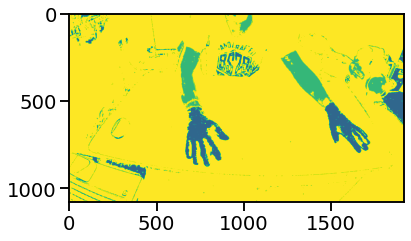

In [ ]:
a=verdes.shape
print(a)
clasif=np.zeros(a[0:2],dtype='int')
print(knn.predict([[40, 80, 40]]))
for i in range(a[0]): #filas
    for j in range(a[1]): #columnas
        clasif[i,j]=knn.predict([verdes[i,j,:]])        
clasif[0,0]=0 #para unificar paletas (con 4 colores)         
plt.imshow(clasif)

In [ ]:
from statistics import mode
clasif2=clasif.copy()
for i in range(2,a[0]-2): #filas
    for j in range(2,a[1]-2): #columnas
        try:
            clasif2[i,j]=mode(clasif[i-2:i+3,j-2:j+3].ravel())
        except:
            clasif2[i,j]=clasif[i,j]
clasif2[0,0]=0 #para unificar paletas (con 4 colores)

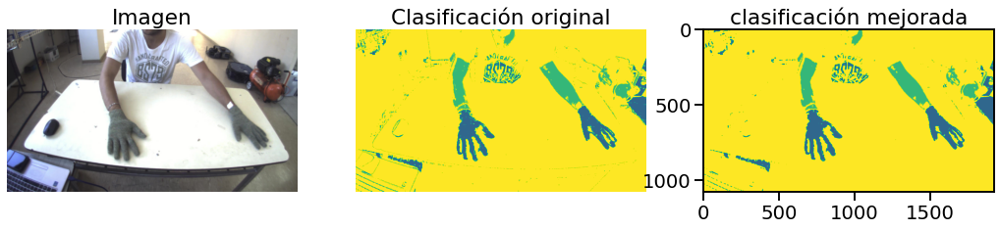

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=3, sharex=True)
fig.set_figheight(10)
fig.set_figwidth(18)
axs[0].imshow(verdes)
axs[0].set_title("Imagen")
axs[0].axis('off')
axs[1].imshow(clasif)
axs[1].set_title("Clasificación original")
axs[1].axis('off')
axs[2].imshow(clasif2)
axs[2].set_title('clasificación mejorada')
#axs[2].axis('off')
plt.show()

##4.2 Mano-Guante

### 4.2.1 Mano-Amarillo

dimensiones de la imagen:  (1080, 1920, 3) es decir:  1080 x 1920  pixeles RGB
tipo de datos:  uint8


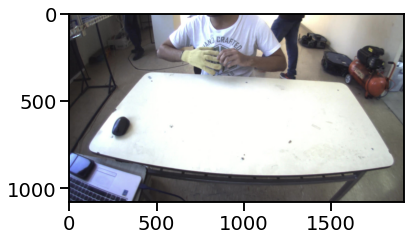

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
guantes_cv=cv2.imread('M_G_Mostrando_Mano-Amarillo_33.jpg')
mano_amarillo=guantes_cv.copy()
mano_amarillo[:,:,[2,1,0]]=guantes_cv #cv2 lee en orden BGR'
print('dimensiones de la imagen: ', mano_amarillo.shape, 'es decir: ', mano_amarillo.shape[0],'x',mano_amarillo.shape[1],' pixeles RGB')
print('tipo de datos: ', mano_amarillo.dtype)
plt.imshow(mano_amarillo)


In [ ]:
dims=mano_amarillo.shape
cant_filas=dims[0]
cant_columnas=dims[1]
cant_pixeles=cant_filas*cant_columnas
data0=np.zeros([cant_pixeles,4],dtype='int')
for f in range(cant_filas):
    for c in range(cant_columnas):
        nro=f*cant_columnas+c
        data0[nro,0]=nro
        data0[nro,1:4]=mano_amarillo[f,c,:]

df = pd.DataFrame(data0, columns=["pixel_id","rojo","verde","azul"])

print('Tamaño de Base de pixeles:', df.shape)
df.head()

Tamaño de Base de pixeles: (2073600, 4)


,pixel_id,rojo,verde,azul
0,0,45,44,50
1,1,44,43,49
2,2,44,43,49
3,3,45,44,50
4,4,46,45,51


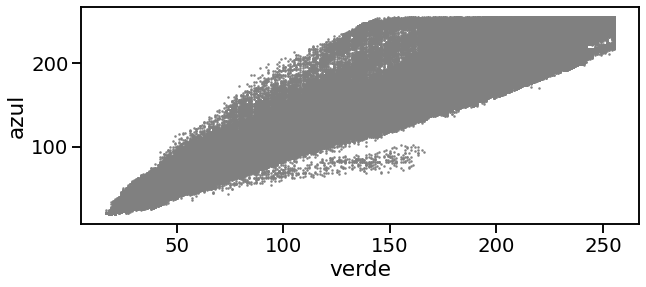

In [ ]:
import matplotlib.patches as mpatches

variables=["rojo","verde","azul"]

variable1=variables[1]
variable2=variables[2]

f1 = df[variable1].values
f2 = df[variable2].values

plt.figure(figsize=(10,4))
sns.set_context(context='talk', font_scale=1.2)
plt.scatter(f1, f2,c='gray', s=1)
plt.xlabel(variable1)
plt.ylabel(variable2)
plt.show()

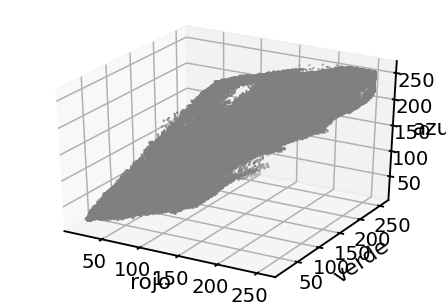

<Figure size 3600x1440 with 0 Axes>

In [ ]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D

fig = pyplot.figure()
ax = Axes3D(fig)

ax.scatter(df[variables[0]].values, df[variables[1]].values, df[variables[2]].values,c='gray', s=1)
ax.set_xlabel(variables[0])
ax.set_ylabel(variables[1])
ax.set_zlabel(variables[2])

plt.figure(figsize=(50,20))
plt.show()

In [ ]:
#guantes
roi1=(688, 237, 67, 39)
#persona
roi2=(1101, 264, 122, 42)
#fondo
roi3=(1250, 18, 594, 709)

In [ ]:
rois=[roi1,roi2,roi3]

In [ ]:
cantidad=0
for i in range(3):
    cantidad=cantidad+(rois[i][2]*rois[i][3])
print (cantidad)
data=np.zeros([cantidad,5],dtype='int')
target=np.zeros(cantidad,dtype='int')
cuenta=0
for i in range(3):
    roi=rois[i]
    
    for fil in range (roi[1],roi[1]+roi[3]):
        for col in range (roi[0],roi[0]+roi[2]):
            nro=fil*cant_columnas+col
            data[cuenta,0]=nro
            data[cuenta,1:4]=mano_amarillo[fil,col,:]
            data[cuenta,4]=i+1
            target[cuenta]=i+1
            cuenta=cuenta+1

df_etiquetado = pd.DataFrame(data, columns=["pixel_id","rojo","verde","azul","etiqueta"])
print(df_etiquetado.shape)
print('Base de pixeles etiquetados:')
df_etiquetado.head()

428883
(428883, 5)
Base de pixeles etiquetados:


,pixel_id,rojo,verde,azul,etiqueta
0,455728,225,229,194,1
1,455729,226,230,195,1
2,455730,228,232,195,1
3,455731,228,232,195,1
4,455732,228,232,195,1


cantidad de muestras etiquetadas: 428883
cantidad de clases etiquetadas: 3
cantidad de variables/dimension: 3
se grafican de a dos (dimensión 2)


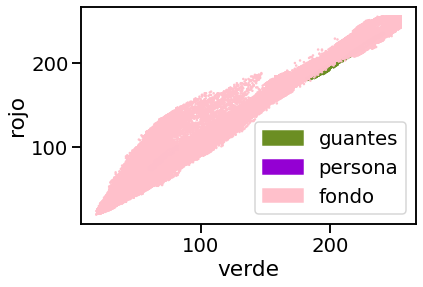

In [ ]:
import matplotlib.patches as mpatches

colores=['olivedrab','darkviolet','pink']
variables=["rojo","verde","azul"]

variable1=variables[1]
variable2=variables[0]

f1 = df_etiquetado[variable1].values
f2 = df_etiquetado[variable2].values
f3 = target

# Vamos a pintar en colores las 3 clases: verde: 0, azul:1, rosa:2
asignar=[]
l=len(f3)
print('cantidad de muestras etiquetadas:',l)
print('cantidad de clases etiquetadas:',3)
print('cantidad de variables/dimension:',3)
print('se grafican de a dos (dimensión 2)')

for k in range(l): #for index, row in filtered_data.iterrows():
    if(f3[k]==1):
        asignar.append(colores[0])
    elif (f3[k]==2):
        asignar.append(colores[1])
    else:
        asignar.append(colores[2])
plt.scatter(f1, f2, c=asignar, s=1)
plt.xlabel(variable1)
plt.ylabel(variable2)
patch1 = mpatches.Patch(color=colores[0], label='guantes')
patch2 = mpatches.Patch(color=colores[1], label='persona')
patch3 = mpatches.Patch(color=colores[2], label='fondo')
plt.legend(handles=[patch1,patch2,patch3])
plt.show()

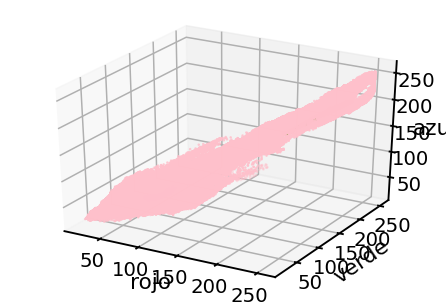

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = Axes3D(fig)

ax.scatter(df_etiquetado[variables[0]].values, df_etiquetado[variables[1]].values, df_etiquetado[variables[2]].values,c=asignar, s=1)
ax.set_xlabel(variables[0])
ax.set_ylabel(variables[1])
ax.set_zlabel(variables[2])
plt.show()

**k-Nearest Neighbors con los pixeles etiquetados**



In [ ]:
from sklearn.neighbors import KNeighborsClassifier
n_neighbors = 5
data_rgb=data[:,1:4]

knn = KNeighborsClassifier(n_neighbors)
knn.fit(data_rgb, target)
print('Presición (Accuracy) del clasificador K-NN en el conjunto de entrenamiento: {:.2f}'
     .format(knn.score(data_rgb, target)))

Presición (Accuracy) del clasificador K-NN en el conjunto de entrenamiento: 1.00


(1080, 1920, 3)
[3]


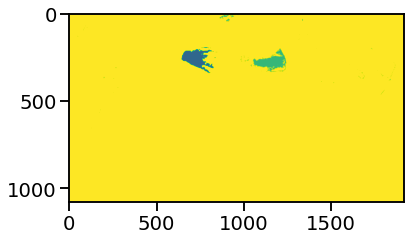

In [ ]:
a=mano_amarillo.shape
print(a)
clasif=np.zeros(a[0:2],dtype='int')
print(knn.predict([[40, 80, 40]]))
for i in range(a[0]): #filas
    for j in range(a[1]): #columnas
        clasif[i,j]=knn.predict([mano_amarillo[i,j,:]])        
clasif[0,0]=0 #para unificar paletas (con 4 colores)         
plt.imshow(clasif)

In [ ]:
from statistics import mode
clasif2=clasif.copy()
for i in range(2,a[0]-2): #filas
    for j in range(2,a[1]-2): #columnas
        try:
            clasif2[i,j]=mode(clasif[i-2:i+3,j-2:j+3].ravel())
        except:
            clasif2[i,j]=clasif[i,j]
clasif2[0,0]=0 #para unificar paletas (con 4 colores)

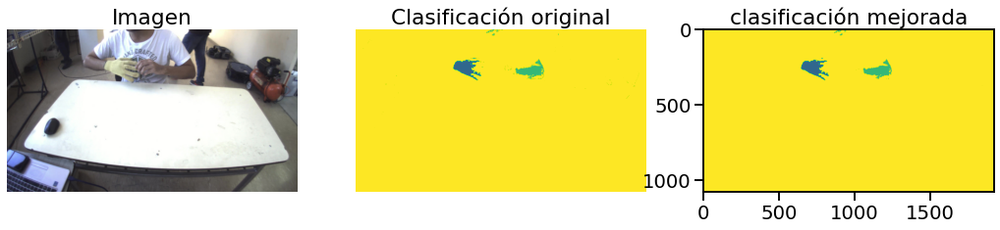

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=3, sharex=True)
fig.set_figheight(10)
fig.set_figwidth(18)
axs[0].imshow(mano_amarillo)
axs[0].set_title("Imagen")
axs[0].axis('off')
axs[1].imshow(clasif)
axs[1].set_title("Clasificación original")
axs[1].axis('off')
axs[2].imshow(clasif2)
axs[2].set_title('clasificación mejorada')
#axs[2].axis('off')
plt.show()

### 4.2.2 Mano-Verde

dimensiones de la imagen:  (1080, 1920, 3) es decir:  1080 x 1920  pixeles RGB
tipo de datos:  uint8


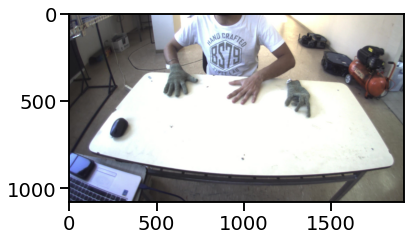

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
guantes_cv=cv2.imread('M_G_Mostrando_Mano-Verde_10.jpg')
mano_verde=guantes_cv.copy()
mano_verde[:,:,[2,1,0]]=guantes_cv #cv2 lee en orden BGR'
print('dimensiones de la imagen: ', mano_verde.shape, 'es decir: ', mano_verde.shape[0],'x',mano_verde.shape[1],' pixeles RGB')
print('tipo de datos: ', mano_verde.dtype)
plt.imshow(mano_verde)


In [ ]:
dims=mano_verde.shape
cant_filas=dims[0]
cant_columnas=dims[1]
cant_pixeles=cant_filas*cant_columnas
data0=np.zeros([cant_pixeles,4],dtype='int')
for f in range(cant_filas):
    for c in range(cant_columnas):
        nro=f*cant_columnas+c
        data0[nro,0]=nro
        data0[nro,1:4]=mano_verde[f,c,:]

df = pd.DataFrame(data0, columns=["pixel_id","rojo","verde","azul"])

print('Tamaño de Base de pixeles:', df.shape)
df.head()

Tamaño de Base de pixeles: (2073600, 4)


,pixel_id,rojo,verde,azul
0,0,54,53,59
1,1,55,54,60
2,2,56,55,61
3,3,57,56,62
4,4,57,56,62


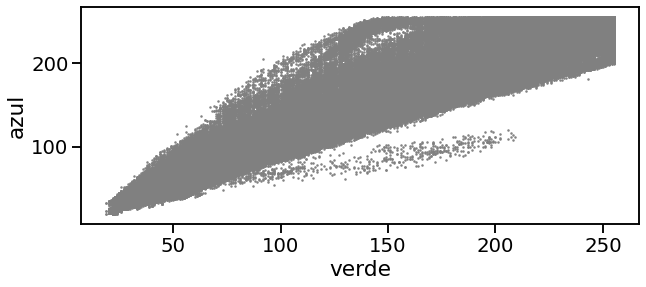

In [ ]:
import matplotlib.patches as mpatches

variables=["rojo","verde","azul"]

variable1=variables[1]
variable2=variables[2]

f1 = df[variable1].values
f2 = df[variable2].values

plt.figure(figsize=(10,4))
sns.set_context(context='talk', font_scale=1.2)
plt.scatter(f1, f2,c='gray', s=1)
plt.xlabel(variable1)
plt.ylabel(variable2)
plt.show()

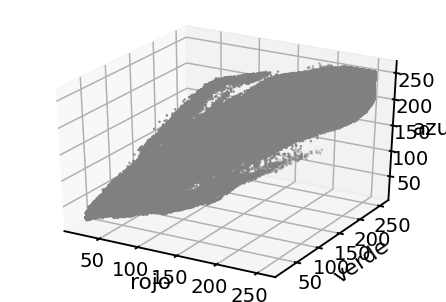

<Figure size 3600x1440 with 0 Axes>

In [ ]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D

fig = pyplot.figure()
ax = Axes3D(fig)

ax.scatter(df[variables[0]].values, df[variables[1]].values, df[variables[2]].values,c='gray', s=1)
ax.set_xlabel(variables[0])
ax.set_ylabel(variables[1])
ax.set_zlabel(variables[2])

plt.figure(figsize=(50,20))
plt.show()

In [ ]:
#guantes
roi1=(600, 324, 42, 60)
#persona
roi2=(839, 12, 161, 189)
#fondo
roi3=(1413, 75, 435, 487)

In [ ]:
rois=[roi1,roi2,roi3]

In [ ]:
cantidad=0
for i in range(3):
    cantidad=cantidad+(rois[i][2]*rois[i][3])
print (cantidad)
data=np.zeros([cantidad,5],dtype='int')
target=np.zeros(cantidad,dtype='int')
cuenta=0
for i in range(3):
    roi=rois[i]
    
    for fil in range (roi[1],roi[1]+roi[3]):
        for col in range (roi[0],roi[0]+roi[2]):
            nro=fil*cant_columnas+col
            data[cuenta,0]=nro
            data[cuenta,1:4]=mano_verde[fil,col,:]
            data[cuenta,4]=i+1
            target[cuenta]=i+1
            cuenta=cuenta+1

df_etiquetado = pd.DataFrame(data, columns=["pixel_id","rojo","verde","azul","etiqueta"])
print(df_etiquetado.shape)
print('Base de pixeles etiquetados:')
df_etiquetado.head()

244794
(244794, 5)
Base de pixeles etiquetados:


,pixel_id,rojo,verde,azul,etiqueta
0,622680,111,127,127,1
1,622681,112,128,128,1
2,622682,109,125,125,1
3,622683,107,121,122,1
4,622684,106,120,120,1


cantidad de muestras etiquetadas: 244794
cantidad de clases etiquetadas: 3
cantidad de variables/dimension: 3
se grafican de a dos (dimensión 2)


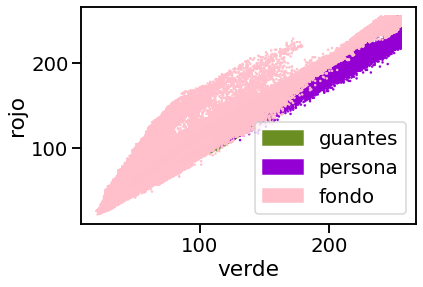

In [ ]:
import matplotlib.patches as mpatches

colores=['olivedrab','darkviolet','pink']
variables=["rojo","verde","azul"]

variable1=variables[1]
variable2=variables[0]

f1 = df_etiquetado[variable1].values
f2 = df_etiquetado[variable2].values
f3 = target

# Vamos a pintar en colores las 3 clases: verde: 0, azul:1, rosa:2
asignar=[]
l=len(f3)
print('cantidad de muestras etiquetadas:',l)
print('cantidad de clases etiquetadas:',3)
print('cantidad de variables/dimension:',3)
print('se grafican de a dos (dimensión 2)')

for k in range(l): #for index, row in filtered_data.iterrows():
    if(f3[k]==1):
        asignar.append(colores[0])
    elif (f3[k]==2):
        asignar.append(colores[1])
    else:
        asignar.append(colores[2])
plt.scatter(f1, f2, c=asignar, s=1)
plt.xlabel(variable1)
plt.ylabel(variable2)
patch1 = mpatches.Patch(color=colores[0], label='guantes')
patch2 = mpatches.Patch(color=colores[1], label='persona')
patch3 = mpatches.Patch(color=colores[2], label='fondo')
plt.legend(handles=[patch1,patch2,patch3])
plt.show()

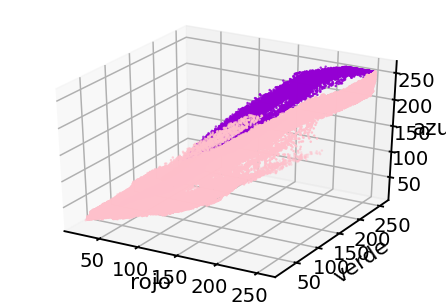

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = Axes3D(fig)

ax.scatter(df_etiquetado[variables[0]].values, df_etiquetado[variables[1]].values, df_etiquetado[variables[2]].values,c=asignar, s=1)
ax.set_xlabel(variables[0])
ax.set_ylabel(variables[1])
ax.set_zlabel(variables[2])
plt.show()

**k-Nearest Neighbors con los pixeles etiquetados**



In [ ]:
from sklearn.neighbors import KNeighborsClassifier
n_neighbors = 5
data_rgb=data[:,1:4]

knn = KNeighborsClassifier(n_neighbors)
knn.fit(data_rgb, target)
print('Presición (Accuracy) del clasificador K-NN en el conjunto de entrenamiento: {:.2f}'
     .format(knn.score(data_rgb, target)))

Presición (Accuracy) del clasificador K-NN en el conjunto de entrenamiento: 0.99


(1080, 1920, 3)
[3]


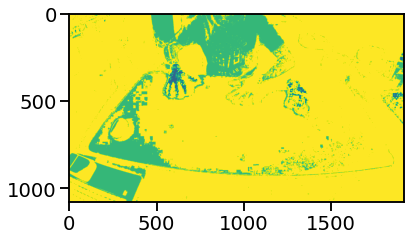

In [ ]:
a=mano_verde.shape
print(a)
clasif=np.zeros(a[0:2],dtype='int')
print(knn.predict([[40, 80, 40]]))
for i in range(a[0]): #filas
    for j in range(a[1]): #columnas
        clasif[i,j]=knn.predict([mano_verde[i,j,:]])        
clasif[0,0]=0 #para unificar paletas (con 4 colores)         
plt.imshow(clasif)

In [ ]:
from statistics import mode
clasif2=clasif.copy()
for i in range(2,a[0]-2): #filas
    for j in range(2,a[1]-2): #columnas
        try:
            clasif2[i,j]=mode(clasif[i-2:i+3,j-2:j+3].ravel())
        except:
            clasif2[i,j]=clasif[i,j]
clasif2[0,0]=0 #para unificar paletas (con 4 colores)

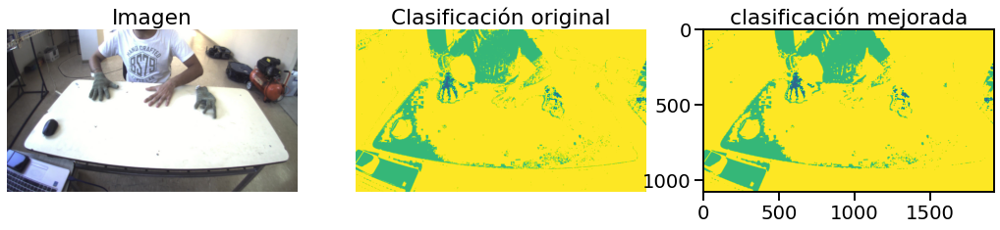

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=3, sharex=True)
fig.set_figheight(10)
fig.set_figwidth(18)
axs[0].imshow(mano_verde)
axs[0].set_title("Imagen")
axs[0].axis('off')
axs[1].imshow(clasif)
axs[1].set_title("Clasificación original")
axs[1].axis('off')
axs[2].imshow(clasif2)
axs[2].set_title('clasificación mejorada')
#axs[2].axis('off')
plt.show()